In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import numpy as np
import os
import pandas as pd
from showit import image
import pprint
from starfish import data, FieldOfView
from starfish.types import Features, Axes
from starfish import Experiment
from starfish.util.argparse import FsExistsType
from starfish.image import Filter
import warnings

# plotting
import matplotlib.pyplot as plt
from matplotlib.ticker import NullLocator
from starfish.plot.decoded_spots import decoded_spots
import seaborn as sns
sns.set_context('talk')
sns.set_style('ticks')
from skimage.color import rgb2gray

# data objects
from starfish import Experiment, FieldOfView, ImageStack

# used in labeling
from starfish.spots import TargetAssignment, Decoder
from starfish.intensity_table.intensity_table import IntensityTable

# display spot data tables
from IPython.display import HTML, display
import tabulate

# used below to establish experiment
def RNAscope(input_json: FsExistsType()):
    experiment = Experiment.from_json(input_json)
    
    pp = pprint.PrettyPrinter(indent=2)
    pp.pprint(experiment._src_doc) # print files associated with the experiment

    return experiment

# splits lists with multiple items into pairs
def splitMergeList(mergeList):
    pairList = []
    for multiples in mergeList:
        multiples = sorted(multiples)
        length = len(multiples)
        if length == 2:
            pairList.append(multiples)
            continue
        for j in range(1,length):
            pairList.append([multiples[j-1],multiples[j]])
    print(pairList)
    return pairList
    
# used in correcting segmentation    
def correctCell(mergeList: dict, removeList: dict, labelImage, numCells, IDtracker: dict):
    if mergeList != []:
        for i in mergeList:
            assert max(i) < numCells+1, "ERROR: The cell ID " + str(max(i)) + " is larger than the number of cells " + str(numCells) + "."
            for j in i:
                assert j not in removeList, "ERROR: You can't put a cell ID in both mergeList and removeList. Cell ID " + str(j) + " can only be in one list."
    if removeList != []:
        assert max(removeList) < numCells+1, "ERROR: The cell ID " + str(max(removeList)) + " is larger than the number of cells " + str(numCells) + "."
        assert len(removeList) == len(set(removeList)), "ERROR: There is a cell ID that appears twice in removeList."
    
    # initialize variables used later on
    indexTracker = [] # this object will keep track of the correct cell ID numbers
    labelImageDict = {}
    for i in range(1,numCells+1):
        indexTracker.append(i)
        labelImageDict[i] = []
    indexTracker = dict(enumerate(indexTracker, 1)) # fill with original cell ID numbers
    x_len = len(labelImage)
    y_len = len(labelImage[0]) # will error if labelImage is not the correct class
    labelImage_return = labelImage.copy()
    numCells_return = numCells
    zeroIDs = []
    seenBefore = []
    # get locations of each pixel of each cell
    
    for mergeGroup in mergeList:
        # get and remove the largest ID, which the other IDs will be merged with
        for i in mergeGroup:
            assert i not in seenBefore, "ERROR: The cell ID " + str(i) + " appears twice in mergeList."
            seenBefore.append(i)
        mergeGroup = sorted(mergeGroup)
        mergeWithID = indexTracker[mergeGroup.pop(len(mergeGroup)-1)]
        
        # update the rest of the IDs
        updated_mergeGroup = list(mergeGroup)
        for i in range(0, len(updated_mergeGroup)):
            updated_mergeGroup[i] = indexTracker[updated_mergeGroup[i]]
        
        # merge the cell IDs and account for numbers
        for removeID in mergeGroup:
            indexTracker[removeID] = mergeWithID
            numCells_return -= 1
            zeroIDs.append(removeID) # track which IDs were removed
        
        # one or more cell IDs are now missing, so update cell IDs internally
        for i in range(1,numCells+1):
            for updated_removeID in sorted(updated_mergeGroup, reverse=True):
                if indexTracker[i] > updated_removeID: 
                    indexTracker[i] = indexTracker[i]-1
    
    for removeID in removeList:
        upToDate_removeID = indexTracker[removeID] # update to current cell ID number
        indexTracker[removeID] = 0 # these IDs are now just part of the background
        for i in range(1,numCells+1):
            if indexTracker[i] > upToDate_removeID: 
                indexTracker[i] = indexTracker[i]-1 # update cell IDs to account for loss of one cell
    
    print(indexTracker)
    # create a dict of the coordinates of each original cell ID
    for x in range(0,x_len):
        for y in range(0,y_len):
            if labelImage[x][y] > 0:
                index = int(labelImage[x][y])
                labelImageDict[index].append([x, y])
    # update the coordinates to match the new merged/removed setup
    for old_ID, new_ID in indexTracker.items():
        if old_ID != new_ID:
            for x,y in labelImageDict[old_ID]:
                labelImage_return[x][y] = new_ID
    
    # create ID tracker with updated internal IDs for use in get_other_coords
    newIDtracker = {} 
    for old_key, new_key in indexTracker.items():
        if old_key in zeroIDs:
            newIDtracker[new_key] = 0
        else:
            newIDtracker[new_key] = IDtracker[old_key] # new_key: perm_val (perm_val is the very first cell ID that new_key had, eg. 10: 13)
    try:
        newIDtracker.pop(0) # remove removed IDs
    except KeyError:
        pass
    
    return labelImage_return, False, False, numCells_return-len(removeList), newIDtracker   

# used in displaying final image
def get_xy_coords(decodedIntensities):
    cache = []
    xy_coords = {}
    index = 0
    for i in decodedIntensities['cell_id'].data:
        if i not in cache:
            cache.append(i)
            xy_coords[i] = (decodedIntensities['x_max'].data[index], decodedIntensities['y_max'].data[index])
        index = index+1
    return xy_coords

# used in displaying final image
def get_other_coords(expressionList, segCoords: dict, num_cells: int, IDtracker: dict, decodedIntensities):
    other_coords = {}
    for i in range(1,num_cells+1):
        does_exist = False
        for exists in decodedIntensities['cell_id'].data==i:
            if exists:
                does_exist = True
                break
        if not does_exist:
            expressionList.insert(i-1, [0])
            other_coords[i] = segCoords[str(IDtracker[i])]
    return other_coords

def get_primary_coords(segCoords: dict, num_cells: int, IDtracker: dict):
    primary_coords = {}
    for i in range(1,num_cells+1):
        primary_coords[i] = segCoords[str(IDtracker[i])]
    return primary_coords

# used in displaying and saving spot data
def get_cellSpotsTable(expressionList, numCells: int, blobType: str):
    axisLabel = "Nucleus ID" if blobType == "nuclei" else "Cell ID" if blobType == "cell" else "ID"
    cellSpotsTable = [[axisLabel],["Num Spots"]]
    for i in range(0, numCells):
        cellSpotsTable[0].append(i+1)
        cellSpotsTable[1].append(expressionList[i][0])
    return cellSpotsTable

def get_num_pixels(filepath):
    width, height = Image.open(filepath).size
    return (width,height)

from PIL import Image
import io
class NucleusChannel:
    def __init__(self, fovChannel):
        self.nuclei = fovChannel
        self.dims = fovChannel.tile_shape
    
    def filterCells(self, low_sigma, channelFile):
        glp = Filter.GaussianLowPass(sigma=low_sigma)
        filtered_image = glp.run(self.nuclei, verbose=True, in_place=False)

        # Display a comparison of unfiltered to filtered cells
        image_mp = self.nuclei.max_proj(Axes.ROUND, Axes.CH, Axes.ZPLANE)
        image_mp_numpy = image_mp._squeezed_numpy(Axes.ROUND, Axes.CH, Axes.ZPLANE)
        filtered_image_mp = filtered_image.max_proj(Axes.ROUND, Axes.CH, Axes.ZPLANE)
        filtered_image_mp_numpy = filtered_image_mp._squeezed_numpy(Axes.ROUND, Axes.CH, Axes.ZPLANE)

        f, ((ax1, ax2)) = plt.subplots(ncols=2, nrows=1, figsize=(30, 45))
        ax1.set_title('Pre-filtered', fontsize=32)
        ax1.axis('off')
        image(image_mp_numpy, ax=ax1)
        ax2.set_title('Filtered', fontsize=32)
        image(filtered_image_mp_numpy, ax=ax2)
        f.tight_layout()

        # Save filtered channel one cells in TIF format

#         from PIL import Image
#         import io

        rgb = np.zeros(filtered_image.tile_shape + (3,))
        rgb[:,:,0] = filtered_image_mp_numpy # Set filtered channel one as background
        do_func = rgb2gray(rgb)
        do_func = do_func/(do_func.max())
        image(do_func,size=10)
        plt.gca().patch.set_visible(False)
        plt.gca().xaxis.set_major_locator(NullLocator())
        plt.gca().yaxis.set_major_locator(NullLocator())

        png1 = io.BytesIO()
        dpi = 140.16
        plt.savefig(png1, format="png", bbox_inches = 'tight',pad_inches = -0.12, dpi=dpi)
        
        png2 = Image.open(png1)
        png2.save(outdir + channelFile)
        png1.close()
        
        for j in range(0,3):
            currDims = get_num_pixels(outdir + channelFile)
            if currDims == self.dims:
                break
            dpi = self.dims[0] / currDims[0] * dpi
            png1 = io.BytesIO()
            plt.savefig(png1, format="png", bbox_inches = 'tight',pad_inches = -0.12, dpi=dpi)

            png2 = Image.open(png1)
            png2.save(outdir + channelFile)
            png1.close()
        if get_num_pixels(outdir + channelFile) != self.dims:
            ##########
            raise Exception("The sizes of the nuclie image could not be resolved correctly.")
    
        # commit these to self for later saving in metadata
        self.low_sigma = low_sigma
        
        # add these to self for later functions
        self.channelFile = channelFile
        self.channelPath = outdir + channelFile
        self.do_image = do_func
        self.filtered_image = filtered_image
        self.filtered_image_mp_numpy = filtered_image_mp_numpy
        
    def detectNuclei(self,dapi_thresh,stain_thresh,min_dist,min_depth,min_size,segFilename,comparisonFilename):
        image_seg = Segmentation.Watershed(
            nuclei_threshold=dapi_thresh,
            input_threshold=stain_thresh,
            min_distance=min_dist,
            size_lim=(min_size, 10000),
            minima_lim=min_depth
        )

        with warnings.catch_warnings():
            warnings.simplefilter('ignore', FutureWarning)
            (label_image, sig_minima), num_blobs = image_seg.modified_run(self.filtered_image, self.filtered_image), image_seg.get_cell_num()
        # set filename as None if you do NOT want to save
        image_seg.show(filename=segFilename)
        # image_seg.show(filename=None)

        written = False # for later use in data writing

        seg_coords = image_seg.coordreturn(label_image, image_dimensions[0], image_dimensions[1])
        num_blobs = len(seg_coords.keys())

        rgb = np.zeros(image_dimensions + (3,))
        rgb[:,:,0] = self.filtered_image_mp_numpy # Set filtered image as background
        do_detect = rgb2gray(rgb)
        do_detect = do_detect/(do_detect.max())

        ID_tracker = [] # this object will keep track of the correct cell ID numbers
        ID_tracker.extend(range(1,num_blobs+1))
        ID_tracker = dict(enumerate(ID_tracker, 1)) # fill with original cell ID numbers
        primaryCoords = get_primary_coords(seg_coords, num_blobs, ID_tracker)

        # display image set up in last cell
        f, ((ax1, ax2)) = plt.subplots(ncols=2, nrows=1, figsize=(30, 45))
        ax1.axis('off')
        image(do_detect,size=10, ax=ax1)
        print("The number of nuclei is: ", num_blobs)

        # label each segmented cell with its cell ID
        for i,(x,y) in primaryCoords.items():
            # if a coordinate is too large or small, the number will fall off the image, so correct it here
            x = 997 if x > 997 else x
            x = 25 if x < 25 else x
            y = 25 if y < 25 else y
            y = 997 if y > 997 else y
            ax1.text(x, y, str(i), fontsize=18, color='yellow')

        firstRun = True
        areYouSure = True

        rgb = np.zeros(image_dimensions + (3,))
        do_black = rgb2gray(rgb)
        image(do_black, ax=ax2) # display filtered primary image
        label_dict_uncorrected = {i: label_image == i for i in range(1, np.max(label_image)+1)}
        label_dict_coords_uncorrected = {i: np.argwhere(label_dict_uncorrected[i]) for i in range(1, np.max(label_image)+1)}
        image(label_image, size=20, cmap=plt.cm.nipy_spectral, ax=ax2)
        for nucleusID in label_dict_coords_uncorrected.keys():
            ax2.plot([i[1] for i in label_dict_coords_uncorrected[nucleusID]], [i[0] for i in label_dict_coords_uncorrected[nucleusID]],\
                     'o',markersize=0.7) # , cmap='nipy_spectral'
            ax2.text(label_dict_coords_uncorrected[nucleusID][0][1], label_dict_coords_uncorrected[nucleusID][0][0], str(nucleusID), fontsize=18, color='yellow')

        plt.savefig(comparisonFilename, bbox_inches = 'tight',pad_inches = 0)

        # add these to self for later functions
        self.label_image = label_image
        self.num_blobs = num_blobs
        self.seg_coords = seg_coords
        self.ID_tracker = ID_tracker #### Do you use this in other functions? You don't use it in mergeHelper *********
        return firstRun,areYouSure
    
    def mergeHelper(self,mergeList,removeList):
        ID_tracker = [] # this object will keep track of the correct cell ID numbers
        ID_tracker.extend(range(1,self.num_blobs+1))
        ID_tracker = dict(enumerate(ID_tracker, 1)) # fill with original cell ID numbers
        label_image_corrected, areYouSure_nuclei, firstRun_nuclei, num_corrected, ID_tracker = correctCell(mergeList, removeList, self.label_image, numCells=self.num_blobs, IDtracker=ID_tracker)

        primaryCoords = get_primary_coords(self.seg_coords, num_corrected, ID_tracker)

        # display image set up in last cell
        f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2, figsize=(27, 30))
        ax1.axis('off')
        ax2.axis('off')
        ax3.axis('off')
        image(self.do_image, ax=ax1)
        print("The number of nuclei is: ", num_corrected)

        # label each segmented cell with its cell ID
        for i,(x,y) in primaryCoords.items():
            # if a coordinate is too large or small, the number will fall off the image, so correct it here
            x = 997 if x > 997 else x
            x = 25 if x < 25 else x
            y = 25 if y < 25 else y
            y = 997 if y > 997 else y
            ax1.text(x, y, str(i), fontsize=18, color='yellow')

        rgb = np.zeros(image_dimensions + (3,))
        do_black = rgb2gray(rgb)
        image(do_black, ax=ax2) # display filtered primary image
        image(label_image_corrected, size=11, cmap=plt.cm.nipy_spectral, ax=ax4)
        labelDict = {i: label_image_corrected == i for i in range(1, np.max(label_image_corrected)+1)}
        labelDict_coords = {i: np.argwhere(labelDict[i]) for i in range(1, np.max(label_image_corrected)+1)}
        for nucleusID in labelDict_coords.keys():
            ax2.plot([i[1] for i in labelDict_coords[nucleusID]], [i[0] for i in labelDict_coords[nucleusID]],\
                     'o',markersize=0.7)
            ax2.text(labelDict_coords[nucleusID][0][1], labelDict_coords[nucleusID][0][0], str(nucleusID), fontsize=18, color='yellow')
            ax4.text(labelDict_coords[nucleusID][0][1], labelDict_coords[nucleusID][0][0], str(nucleusID), fontsize=18, color='yellow')
        plt.gca().xaxis.set_major_locator(NullLocator())
        plt.gca().yaxis.set_major_locator(NullLocator())
        f.tight_layout()

        self.ID_tracker = ID_tracker #### This wasn't saved in the last version before classes were implemented, so make sure this is still the right thing to do *********
        self.num_blobs_corrected = num_corrected
        self.primaryCoords = primaryCoords
        self.label_image_corrected = label_image_corrected
        self.label_dict_coords = labelDict_coords
        
        return self.num_blobs_corrected
    
    # combine data from detection and nuclei segmentation and display dots in nuclei
    def labeling(self, filename, dotsChannel):
        label = TargetAssignment.Label()
        targeted_intensities = label.run(self.label_image_corrected, dotsChannel.intensities3D, verbose=True, in_place=False)
        decoder = Decoder.PerRoundMaxChannelDecoder()
        decoded_intensities_with_bacground = decoder.run(targeted_intensities, experiment.codebook)

        with warnings.catch_warnings():
            warnings.simplefilter('ignore', FutureWarning)
            # Filter out spots that don't belong to a segmented cell
            decoded_intensities = decoded_intensities_with_bacground.where(\
                        decoded_intensities_with_bacground[Features.AXIS]['cell_id'] != 0, drop=True)
            # Filter out spots that weren't in the channel of GENE1
            is_gene1 = decoded_intensities.where(\
                        decoded_intensities[Features.AXIS][Features.TARGET] == dotsChannel.genes[0], drop=True)

        # Get coordinates of one dot in each segmented cell
        expressionList = IntensityTable(decoded_intensities).to_expression_matrix().data.tolist()
        no_spot_coords = get_other_coords(expressionList, self.seg_coords, self.num_blobs_corrected, self.ID_tracker, decoded_intensities)

        # display image set up in last cell
        image(self.do_image,size=10)
        plt.plot(is_gene1.x, is_gene1.y, 'go', markersize=2) # change 'og' for color
        plt.title(f'Green: {GENE1}'); # if you want to change the gene name of the image below, replace GENE1 here with the name in quotes
        print("The number of nuclei is: ", self.num_blobs_corrected)

        # create and display the table
        cellSpotsTable = get_cellSpotsTable(expressionList, self.num_blobs_corrected, "nucleus")
        display(HTML(tabulate.tabulate(cellSpotsTable, tablefmt='html')))

        # label each segmented cell with its cell ID
        for i,(x,y) in self.primaryCoords.items():
            x -= 20
            # if a coordinate is too large or small, the number will fall off the image, so correct it here
            x = 997 if x > 997 else x
            x = 25 if x < 25 else x
            y = 25 if y < 25 else y
            y = 997 if y > 997 else y
            plt.text(x, y, str(i)+": "+str(cellSpotsTable[1][i]), fontsize=13, color='yellow')

        plt.gca().xaxis.set_major_locator(NullLocator())
        plt.gca().yaxis.set_major_locator(NullLocator())
        plt.savefig(filename, bbox_inches = 'tight',pad_inches = 0)

        self.decoded_intensities_with_bacground = decoded_intensities_with_bacground
        self.is_gene1 = is_gene1
        self.cellSpotsTable = cellSpotsTable
        
    def makeNucleiList(self):
        array = []
        for i in range(1,self.num_blobs_corrected+1):
            array.append(i)
        self.posNuclei = array
        posNuc_return = ['']*self.num_blobs_corrected
        for i in array:
            posNuc_return[i-1] = str(i)
        self.posNuc_return = posNuc_return
        
    def printNumNuclei(self):
        print("The number of nuclei is: ", self.num_blobs_corrected)
        
    # save nuclei figure when done correcting
    def imageResults(self):
        # Display background image
        image(self.do_image,size=10)
        plt.plot(self.is_gene1.x, self.is_gene1.y, 'om', markersize=1.5) # change 'om' for color
        # plt.title(f'Magenta: {GENE1}');
        print("The number of nuclei is: ", self.num_blobs_corrected)

        for nucleusID in self.label_dict_coords.keys():
            plt.text(self.label_dict_coords[nucleusID][0][1], self.label_dict_coords[nucleusID][0][0], str(nucleusID)+": "+str(self.cellSpotsTable[1][nucleusID]), fontsize=15, color='yellow')

        # create and display the table
        display(HTML(tabulate.tabulate(self.cellSpotsTable, tablefmt='html')))

        # save image below in outdir
        # series_name = "series004"
        # outdir = "/Users/sbergenholtz/Documents/Projects/Optimize FISH-quant/Output/" + series_name + "/
        plt.gca().xaxis.set_major_locator(NullLocator())
        plt.gca().yaxis.set_major_locator(NullLocator())
        plt.savefig(outdir + 'results_' + series_name + '.png', bbox_inches = 'tight',pad_inches = 0)

import imagej
import json
# save dots results, create the ij variable, then generate composite image
def compositeImageIJ(dotsName: str, nucCh: NucleusChannel, allChannels, fijiPath: str):
    compositeHelper(nucCh)
        
    ij = imagej.init(fijiPath)
    
    compositeHelperTwo(ij, allChannels)
    
    return ij

# ImageJ can only be initalized once or else an error occurs. If an error occurs during the first initialization of ij, then the kernel must be re-started altogether.
def initalizeImageJ(fijiPath):
    try:
        ij
    except NameError:
        return imagej.init(fijiPath)
    else:
        print("ij has already been initialized.")
        return ij

# save dots results, then generate composite image
def compositeImage(dotsName: str, ij, dotCh, nucCh, red=None, green=None, blue=None, gray=None, cyan=None, magenta=None, yellow=None):
    saveFinalDots(dotCh, nucCh)
    saveComposite(ij, [red, green, blue, gray, cyan, magenta, yellow])

# save dots results for compositeImage function
def saveFinalDots(dotCh, nucCh: NucleusChannel):
    # Display background image
    rgb = np.zeros(image_dimensions + (3,))
    do_black = rgb2gray(rgb)
    image(do_black,size=10)
    plt.plot(nucCh.is_gene1.x, nucCh.is_gene1.y, 'om', markersize=1.5) # change 'og' for color
    print("The number of nuclei is: ", nucCh.num_blobs_corrected)
    
    label_dict_nuclei = {i: nucCh.label_image_corrected == i for i in range(1, nucCh.num_blobs_corrected+1)}
    label_dict_nuclei_coords = {i: np.argwhere(label_dict_nuclei[i]) for i in range(1, nucCh.num_blobs_corrected+1)}

    for nucleusID in label_dict_nuclei_coords.keys():
        plt.text(label_dict_nuclei_coords[nucleusID][0][1], label_dict_nuclei_coords[nucleusID][0][0], str(nucCh.cellSpotsTable[1][nucleusID]), fontsize=15, color='yellow')

    # create and display the table
    display(HTML(tabulate.tabulate(nucCh.cellSpotsTable, tablefmt='html')))
    
    plt.gca().patch.set_visible(False)
    plt.gca().xaxis.set_major_locator(NullLocator())
    plt.gca().yaxis.set_major_locator(NullLocator())

#     from PIL import Image
#     import io

    png1 = io.BytesIO()
    dpi = 140.16
    plt.savefig(png1, format="png", bbox_inches = 'tight',pad_inches = -0.12, dpi=dpi)

    png2 = Image.open(png1)
    png2.save(outdir + dotsName)
    png1.close()

    for j in range(0,3):
        currDims = get_num_pixels(outdir + dotsName)
        if currDims == dotCh.dims:
            break
        dpi = dotCh.dims[0] / currDims[0] * dpi
        png1 = io.BytesIO()
        plt.savefig(png1, format="png", bbox_inches = 'tight',pad_inches = -0.12, dpi=dpi)

        png2 = Image.open(png1)
        png2.save(outdir + dotsName)
        png1.close()
    if get_num_pixels(outdir + dotsName) != dotCh.dims:
        ##########
        raise Exception("The sizes of the dots image could not be resolved correctly.")

import string
import random
def random_string(length):
    return ''.join(random.choice(string.ascii_letters) for m in range(length))

# generate composite image for compositeImage function
def saveComposite(ij, colors):
    # create a composite image of the results
    # choose colors for each channel by changing the numbers of the c variables in the line starting with "run("Merge Channels...")" with the following format:
    # c1: red, c2: green, c3: blue, c4: gray, c5: cyan, c6: magenta, c7: yellow
    # To view the tiff with all channels, you must open it in Fiji
    
    chToFilenameDict = dict()
    for ch in colors:
        if ch is not None:
            chToFilenameDict[ch] = dotsName if str(type(ch)) == "<class '__main__.DotsChannel'>" else ch.channelFile
    
    ### NOTE:
    ''' Full macro will look like this:
    #@ String rootPath
    #@ String dotsName
    #@output Object greeting 
    open(rootPath + "dotsResults_SSTR2-5C-39-2.tiff");
    run("8-bit");
    open(rootPath + "nuclei_SSTR2-5C-39-2.tiff");
    run("8-bit");
    open(rootPath + "mCherry_SSTR2-5C-39-2.tiff");
    run("8-bit");
    open(rootPath + "GFP_SSTR2-5C-39-2.tiff");
    run("8-bit");
    open(rootPath + "marker(GFAP)_SSTR2-5C-39-2.tiff");
    run("8-bit");
    getDimensions(w, h, channels, slices, frames);
    run("Merge Channels...", "c1=dotsResults_SSTR2-5C-39-2.tiff c2=nuclei_SSTR2-5C-39-2.tiff c3=mCherry_SSTR2-5C-39-2.tiff c4=GFP_SSTR2-5C-39-2.tiff c5=marker(GFAP)_SSTR2-5C-39-2.tiff c7=dotsResults_SSTR2-5C-39-2.tiff create");
    saveAs("tiff", rootPath + "composite.tiff");
    saveAs("png", rootPath + "composite.png");
    greeting = getTitle() + " saved successfully";
    '''
    
    macro = """
    #@ String rootPath
    #@ String dotsName
    #@output Object greeting 
    """
    for ch in colors:
        if ch is not None:  
            macro += """open(rootPath + \"""" + chToFilenameDict[ch] + """");
    run("8-bit");
    """
    macro += """getDimensions(w, h, channels, slices, frames);
    run("Merge Channels...", \""""
    
    for i in range(0, 7):
        if colors[i] is not None:
            macro += "c" + str(i+1) + "=" + chToFilenameDict[colors[i]] + " "
    
    macro += """create");
    saveAs("tiff", rootPath + "composite.tiff");
    saveAs("png", rootPath + "composite.png");
    greeting = getTitle() + " saved successfully";"""

    args = {
        'rootPath': outdir,
        'dotsName': dotsName
    }
    
    result = ij.py.run_macro(macro, args)
    print(result.getOutput('greeting'))
    
def evalList(newList):
    if type(newList) == list:
        returm = newList
    elif type(newList) == str:
        returm = eval(newList)
    return returm
    
import cv2
from skimage import measure

from typing import List
from math import ceil
from math import floor
class CellChannel:
    def __init__(self, fovChannel):
        self.cells = fovChannel
        self.dims = fovChannel.tile_shape
        
    def filterCells(self, low_sigma, channelFile):
        glp = Filter.GaussianLowPass(sigma=low_sigma)
        filtered_image = glp.run(self.cells, verbose=True, in_place=False)

        # Display a comparison of unfiltered to filtered cells
        image_mp = self.cells.max_proj(Axes.ROUND, Axes.CH, Axes.ZPLANE)
        image_mp_numpy = image_mp._squeezed_numpy(Axes.ROUND, Axes.CH, Axes.ZPLANE)
        filtered_image_mp = filtered_image.max_proj(Axes.ROUND, Axes.CH, Axes.ZPLANE)
        filtered_image_mp_numpy = filtered_image_mp._squeezed_numpy(Axes.ROUND, Axes.CH, Axes.ZPLANE)

        f, ((ax1, ax2)) = plt.subplots(ncols=2, nrows=1, figsize=(30, 45))
        ax1.set_title('Pre-filtered', fontsize=32)
        ax1.axis('off')
        image(image_mp_numpy, ax=ax1)
        ax2.set_title('Filtered', fontsize=32)
        image(filtered_image_mp_numpy, ax=ax2)
        f.tight_layout()

        # Save filtered channel one cells in TIF format

        from PIL import Image
        import io

        rgb = np.zeros(filtered_image.tile_shape + (3,))
        rgb[:,:,0] = filtered_image_mp_numpy # Set filtered channel one as background
        do_func = rgb2gray(rgb)
        do_func = do_func/(do_func.max())
        image(do_func,size=10)
        plt.gca().patch.set_visible(False)
        plt.gca().xaxis.set_major_locator(NullLocator())
        plt.gca().yaxis.set_major_locator(NullLocator())

        png1 = io.BytesIO()
        dpi = 140.16
        plt.savefig(png1, format="png", bbox_inches = 'tight',pad_inches = -0.12, dpi=dpi)

        png2 = Image.open(png1)
        png2.save(outdir + channelFile)
        png1.close()
        
        for j in range(0,3):
            currDims = get_num_pixels(outdir + channelFile)
            if currDims == self.dims:
                break
            dpi = self.dims[0] / currDims[0] * dpi
            png1 = io.BytesIO()
            plt.savefig(png1, format="png", bbox_inches = 'tight',pad_inches = -0.12, dpi=dpi)

            png2 = Image.open(png1)
            png2.save(outdir + channelFile)
            png1.close()
        if get_num_pixels(outdir + channelFile) != self.dims:
            ##########
            raise Exception("The sizes of the image could not be resolved correctly.")
        
        # commit these to self for later saving in metadata
        self.low_sigma = low_sigma
        
        # add these to self for later functions
        self.channelFile = channelFile
        self.channelPath = outdir + channelFile
        self.do_main = do_func
        self.filtered_image = filtered_image
        self.filtered_image_mp_numpy = filtered_image_mp_numpy

    def assignNuclei(self, threshold: int, nucChannel: NucleusChannel, varName: str):    
        img = cv2.imread(self.channelPath)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        blurred = cv2.GaussianBlur(gray, (7, 7), 0)
        thresh = cv2.threshold(blurred, threshold, 255, cv2.THRESH_BINARY)[1]
        thresh = cv2.erode(thresh, None, iterations=2)
        thresh = cv2.dilate(thresh, None, iterations=4)
        labels = measure.label(thresh, neighbors=8, background=0)
        mask = np.zeros(thresh.shape, dtype="uint8")
        paint = np.argwhere(labels > 0)

        rgb = np.zeros(image_dimensions + (3,))
        do_black = rgb2gray(rgb)
    #     f, ((ax1)) = plt.subplots(ncols=1, nrows=1, figsize=(5, 5))
    #     ax1.axis('off')
    #     image(do_black, ax=ax1) # display filtered primary image
    #     ax1.plot([x[1] for x in paint], [x[0] for x in paint],'oy',markersize=0.7)
    #     image((filtered_nuclei_mp_numpy + thresh*0.0001)/2)

        # assign nuclei to the cells in the channel
        percentageCutoff = 0.5 # what's the minimum percentage of a nucleus that should overlap with the cell to be considered as a final nucleus before correction?

        # get the true/false table, coordinates, and area of each nucleus
        label_dict_nuclei = {i: nucChannel.label_image_corrected == i for i in range(1, nucChannel.num_blobs_corrected+1)}
        label_dict_nuclei_coords = {i: np.argwhere(label_dict_nuclei[i]) for i in range(1, nucChannel.num_blobs_corrected+1)}
        num_pixels_nuclei = {i: len(label_dict_nuclei_coords[i]) for i in range(1, nucChannel.num_blobs_corrected+1)}

        # get the true/false table of each cell
        label_dict_cells = {i: labels > 0 for i in range(1, 2)}

        # use the true/false tables of nuclei and cells to perform logical AND to get coords and percentages of 
        #   overlapping nuclei. j is cell ID, i is nucleus ID
        overlapDictCoords = {cellID: {nucleusID: np.argwhere(np.logical_and(label_dict_nuclei[nucleusID], label_dict_cells[cellID])) for nucleusID in range(1, nucChannel.num_blobs_corrected+1)} for cellID in range(1, 2)}
        overlapDictPercentage = {cellID: {nucleusID: len(overlapDictCoords[cellID][nucleusID]) / num_pixels_nuclei[nucleusID]\
                                                for nucleusID in range(1, nucChannel.num_blobs_corrected+1)} for cellID in range(1, 2)}

        # display the cells in white, the total nucleus in yellow, and the overlapping portions in green
        f, ((ax1, ax2)) = plt.subplots(ncols=2, nrows=1, figsize=(30, 45))
        ax1.set_title('Nuclei with Dots', fontsize=32)
        ax1.axis('off')
        image(self.do_main,size=10,ax=ax1) # display filtered primary image
        overlapsList = [nucleusID for nucleusID,percentage in overlapDictPercentage[1].items()\
                                 if percentage>percentageCutoff]
        mapped = set()
        for nucleusID in overlapsList:
            # if nucleus not mapped, map the nucleus ID in yellow and entire nucleus in white
            if nucleusID not in mapped:
                ax1.plot([i[1] for i in label_dict_nuclei_coords[nucleusID]], [i[0] for i in label_dict_nuclei_coords[nucleusID]],\
                         'ow',markersize=0.7)
                ax1.text(label_dict_nuclei_coords[nucleusID][0][1]-10, label_dict_nuclei_coords[nucleusID][0][0], str(nucleusID), fontsize=27, color='yellow')
                mapped.add(nucleusID)
            # always map the overlapping portion in green
            ax1.plot([i[1] for i in overlapDictCoords[1][nucleusID]], \
                    [i[0] for i in overlapDictCoords[1][nucleusID]], 'og', markersize=0.7)

        mapped = set()
        nonOverlappingList = list(range(1,nucChannel.num_blobs_corrected+1))
        for i in overlapsList:
            nonOverlappingList.remove(i)
        for nucleusID in nonOverlappingList:
            # if nucleus not mapped, map the nucleus ID and entire nucleus in yellow
            if nucleusID not in mapped:
                ax1.plot([i[1] for i in label_dict_nuclei_coords[nucleusID]], [i[0] for i in label_dict_nuclei_coords[nucleusID]],\
                         'og',markersize=0.4)
                ax1.text(label_dict_nuclei_coords[nucleusID][0][1]-10, label_dict_nuclei_coords[nucleusID][0][0], str(nucleusID), fontsize=27, color='yellow')
                mapped.add(nucleusID)
            ax1.plot([i[1] for i in label_dict_nuclei_coords[nucleusID]], \
                    [i[0] for i in label_dict_nuclei_coords[nucleusID]], 'or', markersize=0.7)

        ax2.set_title('Channel Two Cells', fontsize=32)
        ax2.axis('off')
        image(self.do_main,size=10, ax=ax2)
        f.tight_layout()

        print("Is the below list of nuclei correct? If not, edit it, then press OK. You don't have to press OK if the list is already correct.")
        from IPython.display import HTML
        newvar = ""
        def random_string(length):
            return ''.join(random.choice(string.ascii_letters) for m in range(length))
        inptval = random_string(10)

        htm = """
        <input id='""" + inptval +  """' style="width:60%;" type="text" value='""" + str(overlapsList) + """'>
        <button onclick="set_value()" style="width:20%;">OK</button>

        <script type="text/Javascript">
            function set_value(){
                var input_value = document.getElementById('""" + inptval + """').value;
                var command =\"""" + varName + """ = '" + input_value + "'";
                var kernel = IPython.notebook.kernel;
                kernel.execute(command);
            }
        </script>
        """
        
        self.label_dict_nuclei_coords = label_dict_nuclei_coords
        return overlapsList, htm
        
    # generate images displaying positive cells in a specific channel
    def determineNucleiAssignment(self, referenceTitle, channelTitle, nucChannel: NucleusChannel):
        # get the true/false table, coordinates, and area of each nucleus
        label_dict_nuclei = {i: nucChannel.label_image_corrected == i for i in range(1, nucChannel.num_blobs_corrected+1)}
        label_dict_nuclei_coords = {i: np.argwhere(label_dict_nuclei[i]) for i in range(1, nucChannel.num_blobs_corrected+1)}
        # num_pixels_nuclei = {i: len(label_dict_nuclei_coords[i]) for i in range(1, nucChannel.num_blobs_corrected+1)}

        f, ((ax1, ax2)) = plt.subplots(ncols=2, nrows=1, figsize=(30, 45))
        ax1.set_title(referenceTitle, fontsize=32)
        ax1.axis('off')

        # display the cells in white, the total nucleus in yellow, and the overlapping portions in green
        image(self.do_main, ax=ax1) # display filtered primary image
        for nucleusID in label_dict_nuclei_coords.keys():
            ax1.plot([i[1] for i in label_dict_nuclei_coords[nucleusID]], [i[0] for i in label_dict_nuclei_coords[nucleusID]],\
                     'oy',markersize=0.7)
            ax1.text(label_dict_nuclei_coords[nucleusID][0][1], label_dict_nuclei_coords[nucleusID][0][0], str(nucleusID)+": "+str(nucChannel.cellSpotsTable[1][nucleusID]), fontsize=18, color='yellow')

        ax1.plot(nucChannel.is_gene1.x, nucChannel.cellSpotsTable.y, 'om', markersize=1.5)

        # display image set up in last cell
        print("The number of nuclei is: ", nucChannel.num_blobs_corrected)

        ax2.set_title(channelTitle, fontsize=32)
        ax2.axis('off')
        image(self.do_main, ax=ax2)
        f.tight_layout()
        self.label_dict_nuclei_coords = label_dict_nuclei_coords
        
    def enterPosNuclei(self, posNucleiList):
        self.posNuclei = evalList(posNucleiList)
        posNuc_return = ['']*num_nuclei_corrected
        for i in range(1, num_nuclei_corrected+1):
            if i in posNucleiList:
                posNuc_return[i-1] = str(i)
        self.posNuc_return = posNuc_return
        
    def compareResults(self, positiveChannels: List[List[int]], negativeChannels: List[List[int]], allCellChannels, image_title: str, filename: str, nucChannel: NucleusChannel):
        assert len(positiveChannels)+len(negativeChannels) >= 1, "ERROR: There must be at least one channel to compare."
        
        result = set()
        if len(positiveChannels) >= 1:
            result = set(positiveChannels[0].posNuclei)
            for i in positiveChannels[1:]:
                result = result & set(i.posNuclei)

        if len(negativeChannels) >= 1:
            if len(positiveChannels) == 0:
                result = []
                for i in nucChannel.posNuclei:
                    result.append(i)
                result = set(result)
            for i in negativeChannels:
                result = result - set(i.posNuclei)
        image(self.do_main, size=13)
        plt.title(image_title, fontsize=32)
        with warnings.catch_warnings():
            warnings.simplefilter('ignore', FutureWarning)
            # Filter out spots that don't belong to a segmented cell
            is_gene1_result = nucChannel.is_gene1.where(\
                        nucChannel.is_gene1[Features.AXIS]['cell_id'] != 0, drop=True)
            for i in range(1, nucChannel.num_blobs_corrected+1):
                if i not in result:
                    is_gene1_result = is_gene1_result.where(\
                        is_gene1_result[Features.AXIS]['cell_id'] != i, drop=True)

        for nucleusID in result:
            plt.plot([i[1] for i in self.label_dict_nuclei_coords[nucleusID]], [i[0] for i in self.label_dict_nuclei_coords[nucleusID]],\
                     'oy',markersize=0.7)
            plt.text(self.label_dict_nuclei_coords[nucleusID][0][1], self.label_dict_nuclei_coords[nucleusID][0][0], str(nucleusID)+": "+str(nucChannel.cellSpotsTable[1][nucleusID]), fontsize=15, color='yellow')
        plt.plot(is_gene1_result.x, is_gene1_result.y, 'om', markersize=1.5)

        plt.gca().xaxis.set_major_locator(NullLocator())
        plt.gca().yaxis.set_major_locator(NullLocator())
        plt.savefig(filename, bbox_inches = 'tight',pad_inches = 0)

    #         f, ((ax1, ax2),(ax3,ax4),(ax5,ax6)) = plt.subplots(ncols=2, nrows=3, figsize=(20, 30))
        nrows = ceil(len(allCellChannels) / 2) + 1
        f, axs = plt.subplots(ncols=2, nrows=nrows, figsize=(20, 30))

        ax1 = axs[0][0]
        ax1.set_title(image_title, fontsize=36)
        ax1.axis('off')
        image(self.do_main, size=13, ax=ax1) # display filtered primary image

        # display the cells in white, the total nucleus in yellow, and the overlapping portions in green
        for nucleusID in result:
            ax1.plot([i[1] for i in self.label_dict_nuclei_coords[nucleusID]], [i[0] for i in self.label_dict_nuclei_coords[nucleusID]],\
                     'oy',markersize=0.7)
            ax1.text(self.label_dict_nuclei_coords[nucleusID][0][1], self.label_dict_nuclei_coords[nucleusID][0][0], str(nucleusID)+": "+str(nucChannel.cellSpotsTable[1][nucleusID]), fontsize=18, color='yellow')
        ax1.plot(is_gene1_result.x, is_gene1_result.y, 'om', markersize=1.5)

        ax2 = axs[0][1]
        ax2.set_title('Nuclei', fontsize=36)
        ax2.axis('off')
        image(nucChannel.do_image, ax=ax2)

        for ch in range(0, len(allCellChannels)):
            curr_ax = axs[floor(ch/2)+1][ch%2]
            curr_ax.set_title(allCellChannels[ch].channelName, fontsize=36)
            curr_ax.axis('off')
            image(allCellChannels[ch].do_main, ax=curr_ax)
        if len(allCellChannels)%2 == 1:
            axs[-1][1].axis('off')

        f.tight_layout()
        f.gca().xaxis.set_major_locator(NullLocator())
        f.gca().yaxis.set_major_locator(NullLocator())

        f.savefig(filename[:filename.rfind('cells_')+5] + '_allChs' + filename[filename.rfind('cells_')+5:], bbox_inches = 'tight',pad_inches = 0)

        return sorted(list(result))

class DotsChannel:
    def __init__(self, fovChannel):
        self.dots = fovChannel
        self.dims = fovChannel.tile_shape
    
    # filter dots raw data
    def filterDots(self, dotsHighSigma, numHighPasses, dotsLowSigma, outdir, filename):
        from starfish.image import Filter
        dots_mp = self.dots.max_proj(Axes.ROUND, Axes.CH, Axes.ZPLANE)
        dots_mp_numpy = dots_mp._squeezed_numpy(Axes.ROUND, Axes.CH, Axes.ZPLANE)
        f, ((ax1, ax2)) = plt.subplots(ncols=2, nrows=1, figsize=(30, 15))
        ax1.set_title('Pre-filtered Dots', fontsize=32)
        ax1.axis('off')
        image(dots_mp_numpy, ax=ax1, cmap='inferno', clim=(-0.001))

        clip_50 = Filter.Clip(p_min=97)
        clipped = clip_50.run(self.dots)

        # higher sigma = more background removed
        ghp = Filter.GaussianHighPass(sigma=dotsHighSigma)
        high_passed = ghp.run(clipped, verbose=True, in_place=False)
        for i in range(1,numHighPasses):
            high_passed = ghp.run(high_passed, verbose=True, in_place=False)

        # higher sigma = more blurry, so keep it low here
        glp = Filter.GaussianLowPass(sigma=numHighPasses)
        low_passed = glp.run(high_passed, in_place=False, verbose=True)

        dots_mp = low_passed.max_proj(Axes.ROUND, Axes.CH, Axes.ZPLANE)
        filtered_dots_mp_numpy = dots_mp._squeezed_numpy(Axes.ROUND, Axes.CH, Axes.ZPLANE)
        ax2.set_title('Filtered Dots', fontsize=32)
        image(filtered_dots_mp_numpy, ax=ax2, cmap='inferno', clim=(-0.001))
        f.tight_layout()

        try:
            os.mkdir(outdir)
        except FileExistsError:
            pass
        plt.gca().xaxis.set_major_locator(NullLocator())
        plt.gca().yaxis.set_major_locator(NullLocator())
        f.savefig(filename, bbox_inches = 'tight',pad_inches = 0)
        
        # commit these to self for later saving in metadata
        self.dotsHighSigma = dotsHighSigma
        self.numHighPasses = numHighPasses
        self.dotsLowSigma = dotsLowSigma
        
        # commit these to self for later use in other functions
        self.filtered_dots = low_passed
        self.filtered_dots_mp_numpy = filtered_dots_mp_numpy
        
    def detection3D(self,spot_diameter,min_mass,max_size,separation,filename):
        p = SpotFinder.TrackpyLocalMaxPeakFinder(
            spot_diameter=spot_diameter, # must be odd integer
            min_mass=min_mass,
            max_size=max_size,  # this is max radius
            separation=separation,
            noise_size=0.65,  # this is not used because preprocess is False
            preprocess=False,
            percentile=10,  # this is irrelevant when min_mass, spot_diameter, and max_size are set properly
            verbose=True,
            is_volume=True,
        )
        
        dots_mp_tmp = self.filtered_dots.max_proj(Axes.ROUND, Axes.ZPLANE)
        blobs_image = dots_mp_tmp._squeezed_numpy(Axes.ROUND, Axes.ZPLANE)

        intensities3D = p.run(self.filtered_dots)

        decoded = experiment.codebook.decode_per_round_max(intensities3D)
        decoded = decoded[decoded["total_intensity"]>.035]
        genes, counts = np.unique(decoded.loc[decoded[Features.PASSES_THRESHOLDS]][Features.TARGET], return_counts=True)
        print("The number of spots in the image is:", str(counts[0]))

        f, ((ax1, ax2)) = plt.subplots(ncols=2, nrows=1, figsize=(30, 45))
        ax1.set_title('Original Image', fontsize=32)
        ax1.axis('off')
        image(self.filtered_dots_mp_numpy, ax=ax1, size=15, cmap='inferno', clim=(-0.0023))
        ax2.set_title('Detected Spots', fontsize=32)

        rgb = np.zeros(image_dimensions + (3,))
        # rgb[:,:,0] = filtered_nuclei_mp_numpy # Set nuclei as background
        rgb[:,:,1] = self.filtered_dots_mp_numpy
        do_dots = rgb2gray(rgb)
        do_dots = do_dots/(do_dots.max())

        # display image set up in last cell
        image(do_dots,ax=ax2,size=15)
        #     for nucleusID in label_dict_nuclei_coords.keys():
        #         ax2.plot([i[1] for i in label_dict_nuclei_coords[nucleusID]], [i[0] for i in label_dict_nuclei_coords[nucleusID]],\
        #                  'oy',markersize=0.7)

        #     ax2.plot(intensities.x-1, intensities.y-1, 'mo', markersize=8, fillstyle='none') # change 'og' for color
        ax2.plot(intensities3D.x, intensities3D.y, 'go', markersize=1.5) # change 'og' for color
        plt.gca().xaxis.set_major_locator(NullLocator())
        plt.gca().yaxis.set_major_locator(NullLocator())
        f.tight_layout()
        foundIndex = filename.rfind('found')
        filename=filename[:foundIndex+5] + str(counts[0]) + filename[foundIndex+5:]
        plt.savefig(filename, bbox_inches = 'tight',pad_inches = 0) # Uncomment to save image

        # commit these to self for later saving in metadata
        self.intensities3D = intensities3D
        
        # commit these to self for later use in other functions
        self.genes = genes
        self.counts = counts
        self.do_dots = do_dots
    
    def detection2D(self,p,filename):
        noDots = False
        dots_mp_tmp = self.filtered_dots.max_proj(Axes.ROUND, Axes.ZPLANE)
        blobs_image = dots_mp_tmp._squeezed_numpy(Axes.ROUND, Axes.ZPLANE)
        try:
            intensities = p.run(self.filtered_dots)
        except ValueError as e:
            noDots = True
            pass
        if noDots:
            raise Exception("ERROR: either your threshold value is too high or the image is completely black.")
        decoded = experiment.codebook.decode_per_round_max(intensities)
        genes, counts = np.unique(decoded.loc[decoded[Features.PASSES_THRESHOLDS]][Features.TARGET], return_counts=True)
        print("The number of spots in the image is:", str(counts[0]))

        f, ((ax1, ax2)) = plt.subplots(ncols=2, nrows=1, figsize=(30, 45))
        ax1.set_title('Original Image', fontsize=32)
        ax1.axis('off')
        image(self.filtered_dots_mp_numpy, ax=ax1, size=15, cmap='inferno', clim=(-0.0023))
        ax2.set_title('Detected Spots', fontsize=32)

        rgb = np.zeros(image_dimensions + (3,))
        # rgb[:,:,0] = filtered_nuclei_mp_numpy # Set nuclei as background
        rgb[:,:,1] = self.filtered_dots_mp_numpy
        do_dots = rgb2gray(rgb)
        do_dots = do_dots/(do_dots.max())

        # display image set up in last cell
        image(do_dots,ax=ax2,size=15)
    #     for nucleusID in label_dict_nuclei_coords.keys():
    #         ax2.plot([i[1] for i in label_dict_nuclei_coords[nucleusID]], [i[0] for i in label_dict_nuclei_coords[nucleusID]],\
    #                  'oy',markersize=0.7)

    #     ax2.plot(intensities.x-1, intensities.y-1, 'mo', markersize=8, fillstyle='none') # change 'og' for color
        ax2.plot(intensities.x, intensities.y, 'go', markersize=1.5) # change 'og' for color
        plt.gca().xaxis.set_major_locator(NullLocator())
        plt.gca().yaxis.set_major_locator(NullLocator())
        f.tight_layout()
        foundIndex = filename.rfind('found')
        filename=filename[:foundIndex+5] + str(counts[0]) + filename[foundIndex+5:]
        plt.savefig(filename, bbox_inches = 'tight',pad_inches = 0) # Uncomment to save image

        # commit these to self for later saving in metadata
        self.intensities2D = intensities
        
        # commit these to self for later use in other functions
        self.genes2D = genes
        self.counts2D = counts
        self.do_dots2D = do_dots
    
    def intensityTool(self, upperThreshold, lowerThreshold, showLowIntensities):
        # Determine the correct threshold for detection
        # Spots with threshold > upper_threshold = green dots
        # Spots with threshold between upper_threshold and lowerThreshold = magenta circles

        assert upperThreshold > lowerThreshold, "ERROR: The upper threshold (" + str(upperThreshold) + ") must be greater than lower threshold (" + str(lowerThreshold) + ")."  

        f, ((ax1)) = plt.subplots(ncols=1, nrows=1, figsize=(30, 45))
        ax1.axis('off')

        # display image set up in last cell
        image(self.do_dots,ax=ax1,size=15)
        # uncomment the below 3 lines to see where the nuclei are
        # label_dict_nuclei = {i: label_image_nuclei_corrected == i for i in range(1, num_nuclei+1)}
        # label_dict_nuclei_coords = {i: np.argwhere(label_dict_nuclei[i]) for i in range(1, num_nuclei+1)}
        # for nucleusID in label_dict_nuclei_coords.keys():
        #     ax1.plot([i[1] for i in label_dict_nuclei_coords[nucleusID]], [i[0] for i in label_dict_nuclei_coords[nucleusID]],\
        #              'oy',markersize=0.7)

        key = 'total_intensity'
        try:
            intensities_above = self.intensities3D.where(self.intensities3D[Features.AXIS][key] > upperThreshold, drop=True)
        except KeyError:
            key = 'intensity'
            intensities_above = self.intensities3D.where(self.intensities3D[Features.AXIS][key] > upperThreshold, drop=True)
        intensities_between = self.intensities3D.where(self.intensities3D[Features.AXIS][key] < upperThreshold, drop=True)
        intensities_between = intensities_between.where(intensities_between[Features.AXIS][key] > lowerThreshold, drop=True)
        for i in range(0,10):
            ax1.plot(intensities_between.x-0.5, intensities_between.y-0.5, 'mo', markersize=18, fillstyle='none') # change the 'm' in 'mo' for color
        ax1.plot(intensities_above.x, intensities_above.y, 'go', markersize=3) # change the 'g' in 'go' for color
        print("The number of spots between", upperThreshold, "and", lowerThreshold, "is:", len(intensities_between.features))
        print("The number of spots above", upperThreshold, "is:", len(intensities_above.features))
        if showLowIntensities:
            intensities_below = self.intensities3D.where(self.intensities3D[Features.AXIS][key] < lowerThreshold, drop=True)
            ax1.plot(intensities_below.x, intensities_below.y, 'ro', markersize=3) # change the 'r' in 'ro' for color
            print("The number of spots below", lowerThreshold, "is:", len(intensities_below.features))

        plt.gca().xaxis.set_major_locator(NullLocator())
        plt.gca().yaxis.set_major_locator(NullLocator())
        f.tight_layout()

from pandas import ExcelWriter
from pandas import ExcelFile
def posNucReturn(positive, negative):
    assert len(positive)+len(negative) >= 1, "ERROR: There must be at least one channel to compare."
    result = set()
    if len(positive) >= 1:
        result = set(positive[0].posNuclei)
        for i in positive[1:]:
            result = result & set(i.posNuclei)

    if len(negative) >= 1:
        if len(positive) == 0:
            result = []
            for i in range(1, num_nuclei_corrected+1):
                result.append(i)
            result = set(result)
        for i in negative:
            result = result - set(i.posNuclei)
    
    returm = ['']*num_nuclei_corrected
    for i in range(1, len(returm)+1):
        if i in result:
            returm[i-1] = str(i)
    return returm

import xlsxwriter
def saveCumulativeData():
    # Write data to a csv file, then convert the file to Excel. This is done because Excel files can't be
    #    easily appended to, but csv files can
    df = pd.DataFrame.from_dict(cumulative_data, orient='index')
    df.to_csv(csv_file_cumulative, mode='a', header=False, index=True)
    # written = False # onlyhttp://localhost:8889/notebooks/2019.04.08_pipeline_SSTR2-40-6_quickVersion_noNuclei.ipynb# uncomment if you want to rewrite the data to the complete Excel file
    if not written:
        with ExcelWriter(excel_file_cumulative) as ew, open(csv_file_cumulative, 'r') as temp_f:
            # Read the lines of csv_file_cumulative
            lines = temp_f.readlines()
            csv_file_delimiter = ','
            # Initialize largest_column_count, the max number of columns a row currently has in the file
            largest_column_count = 0
            for l in lines:
                # Count the column count for the current line
                column_count = len(l.split(csv_file_delimiter)) + 1 
                # Set the largest column count to the current one if a bigger one is found, else keep it the same
                largest_column_count = column_count if largest_column_count < column_count else largest_column_count 
            temp_f.close()
            # Generate column names (will be 0, 1, 2,..,# of lines-1)
            column_names = [i for i in range(0, largest_column_count)] 

            # Read the csv file and save it as an Excel file
            pd.read_csv(csv_file_cumulative, header=None, delimiter=csv_file_delimiter, names=column_names, index_col=False).to_excel(ew, header=False, index=False)
            ew.save()
    

In [2]:
# define root input directory
# root_dir = "/Users/sbergenholtz/Applications/FISHcomp/"
# batch_dir = "data_example/"
root_dir = "/Users/sethie/Applications/SMART-Q/"
batch_dir = ""
GENE1 = "STTR2"
series_dir = "data_example/"
experiment = RNAscope(root_dir + batch_dir + series_dir + "formatted/experiment.json")

series_name = series_dir.split('/')[0] # returns the series_dir name without the slash
outdir = "/Users/sethie/Documents/" + series_name + "/"

fov = experiment.fov()
image_dimensions = fov[FieldOfView.PRIMARY_IMAGES].tile_shape
channel1 = CellChannel(fov[FieldOfView.PRIMARY_IMAGES])
dots = DotsChannel(fov['dots'])
nuclei = NucleusChannel(fov['nuclei'])
channel2 = CellChannel(fov['channel2'])
channel4 = CellChannel(fov['channel4'])

experiment.codebook # display (target: # of target genes, c: # of channels, r: # of imaging rounds)

 18%|█▊        | 3/17 [00:00<00:00, 23.01it/s]

{ 'codebook': 'codebook.json',
  'extras': {},
  'images': { 'channel2': 'channel2.json',
              'channel4': 'channel4.json',
              'dots': 'dots.json',
              'nuclei': 'nuclei.json',
              'primary': 'primary_images.json'},
  'version': '5.0.0'}


100%|██████████| 17/17 [00:00<00:00, 30.96it/s]


<xarray.Codebook (target: 1, c: 1, r: 1)>
array([[[1]]], dtype=uint8)
Coordinates:
  * target   (target) object 'SSTR2'
  * c        (c) int64 0
  * r        (r) int64 0

100%|██████████| 1/1 [00:00<00:00, 104.03it/s]
17it [00:00, 207.92it/s]
17it [00:00, 213.75it/s]
100%|██████████| 1/1 [00:00<00:00, 92.91it/s]


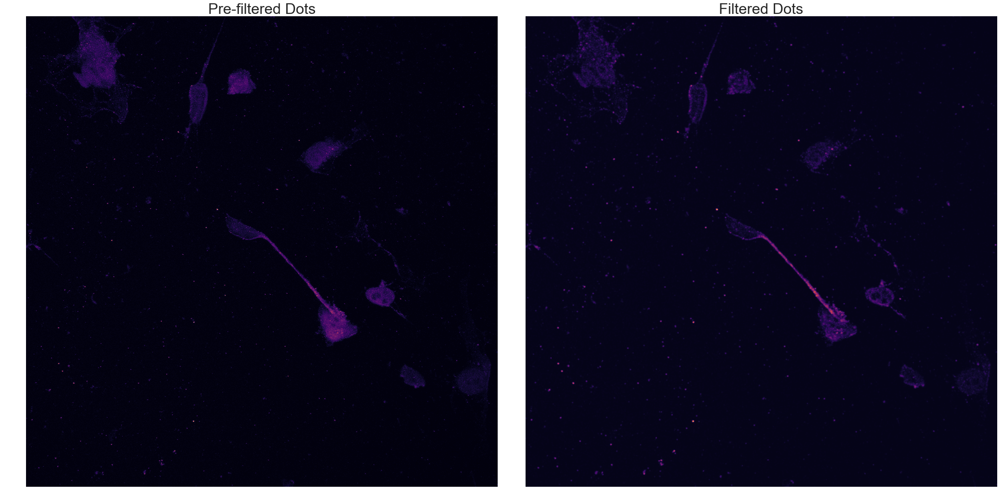

In [3]:
# filter dots raw data

from starfish.image import Filter
dots_high_sigma=5 # lower sigma = less background
num_high_passes=1 # if high background in pre-filtered image, then more than one high pass may help visually. It isn't necessary for detection with a proper threshold, though
dots_low_sigma=0.5 # you shouldn't have to change this

# low_passed,filtered_dots_mp_numpy =
dots.filterDots(
    dots_high_sigma,
    num_high_passes,
    dots_low_sigma,
    outdir=outdir,
    filename=outdir + 'filtering_' + series_name + '.png'
)


17it [00:00, 206.52it/s]
100%|██████████| 1/1 [00:00<00:00, 102.08it/s]
17it [00:00, 202.35it/s]
100%|██████████| 1/1 [00:00<00:00, 103.13it/s]
17it [00:00, 215.47it/s]
100%|██████████| 1/1 [00:00<00:00, 101.99it/s]
17it [00:00, 202.58it/s]
100%|██████████| 1/1 [00:00<00:00, 98.95it/s]


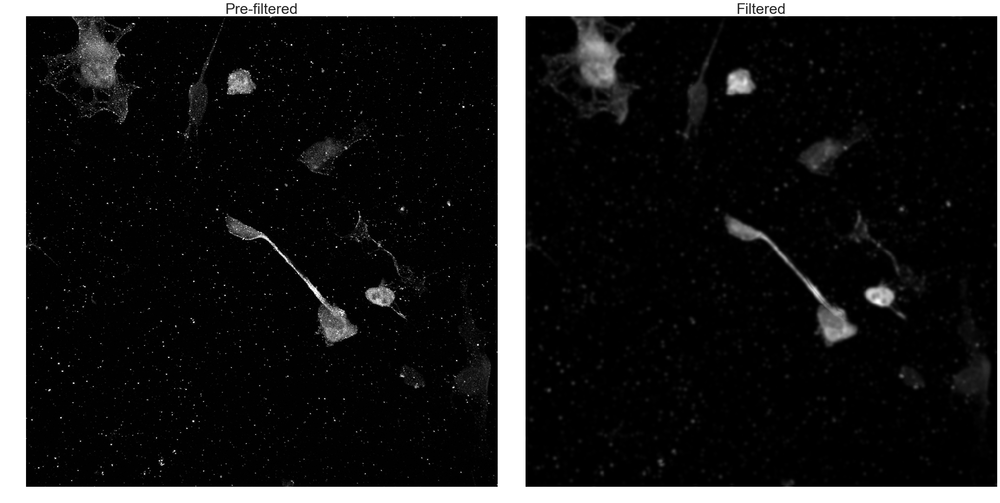

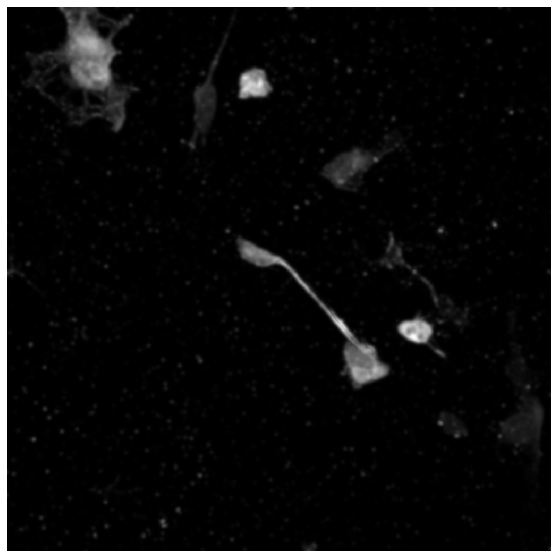

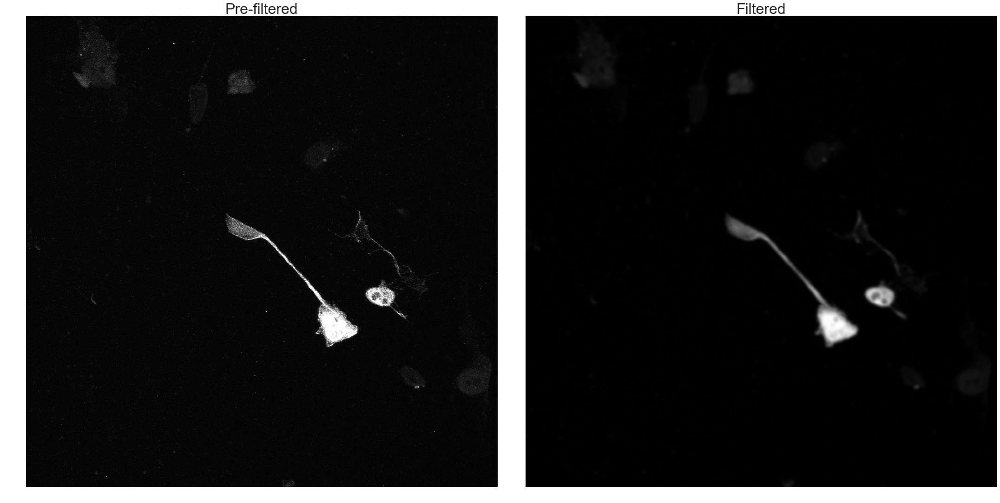

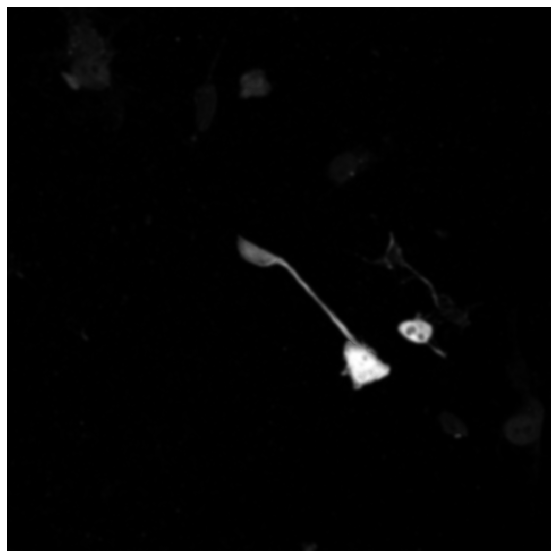

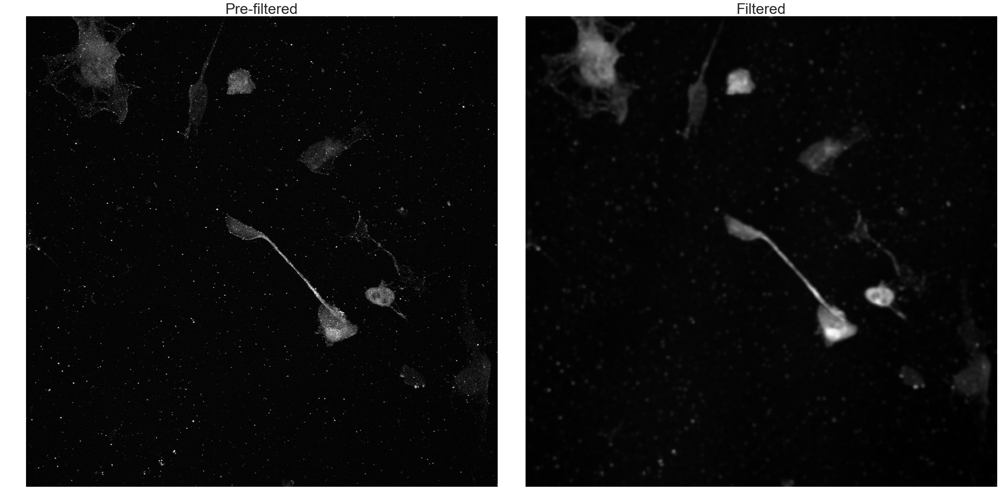

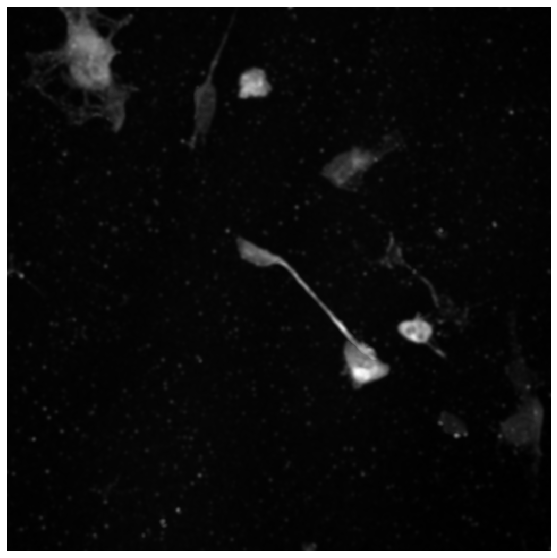

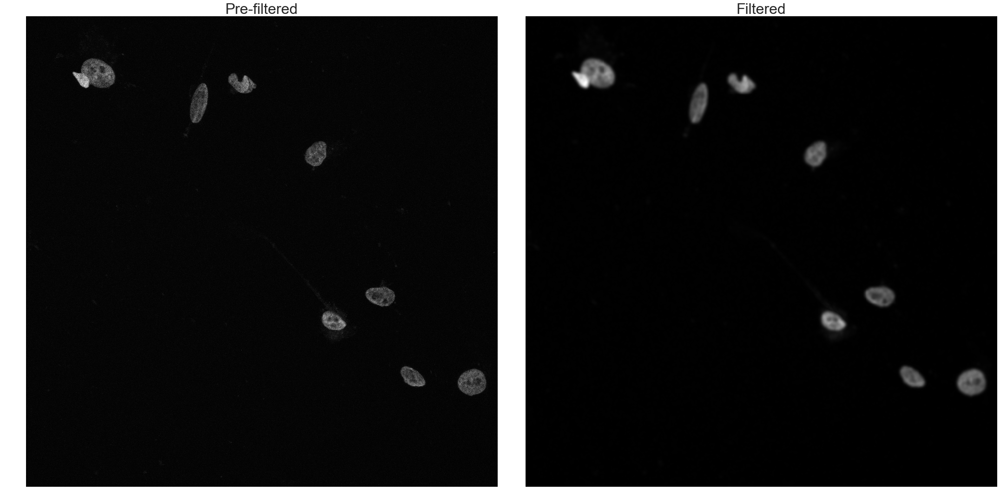

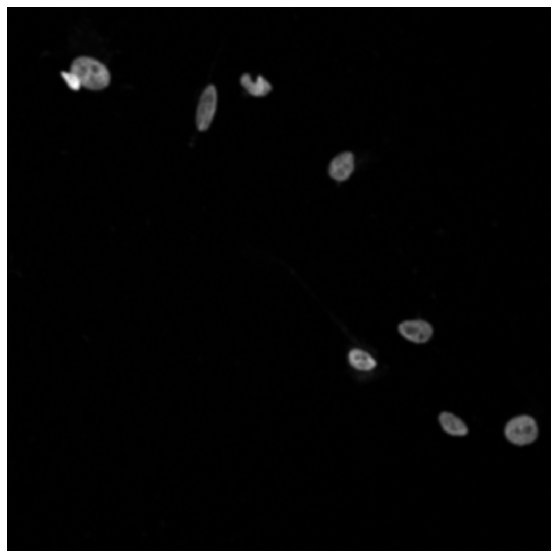

In [4]:
# Filter cell raw data

low_sigma_cells=3 # don't change
channelOneFile = 'mCherry_' + series_name + '.tiff'

# do_cells, filtered_primary_image, filtered_primary_image_mp_numpy = 
channel1.filterCells(
    low_sigma=low_sigma_cells,
    channelFile=channelOneFile
)

# Filter cells in channel 2 raw data
low_sigma_cells2=3 # don't change
channelTwoFile = 'GFP_' + series_name + '.tiff'

# do_cells2,filtered_channel2_image,filtered_channel2_image_mp_numpy = 
channel2.filterCells(
    low_sigma=low_sigma_cells2,
    channelFile=channelTwoFile
)

# Filter cells in channel 4 raw data
low_sigma_cells4=3 # don't change
channelFourFile = 'marker(GFAP)_' + series_name + '.tiff'

# do_cells4,filtered_channel4_image,filtered_channel4_image_mp_numpy = 
channel4.filterCells(
    low_sigma=low_sigma_cells4,
    channelFile=channelFourFile
)

# Filter nuclei raw data
low_sigma_nuclei=3 # don't change
nucleiFile = 'nuclei_' + series_name + '.tiff'

# do_nuclei,filtered_nuclei,filtered_nuclei_mp_numpy = 
nuclei.filterCells(
    low_sigma=low_sigma_nuclei,
    channelFile=nucleiFile
)


100%|██████████| 1/1 [00:00<00:00, 103.21it/s]


The number of spots in the image is: 270


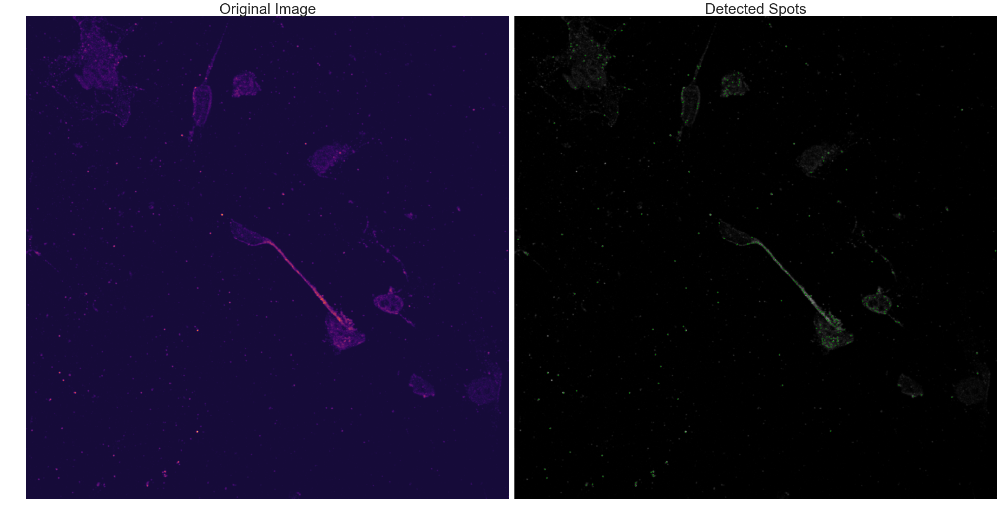

In [5]:
# detect spots

from starfish.spots import SpotFinder
import warnings

spot_diameter = 5
min_mass = 0.065
max_size = 2
separation = 4

# intensities3D, genes, counts, do_dots = 
dots.detection3D(spot_diameter=spot_diameter,min_mass=min_mass,max_size=max_size,separation=separation,
    filename=outdir + 'detection_' + series_name + "_found" + 'dots_Trackpy_LMPF.png'
)


The number of spots between 0.06 and 0.05 is: 0
The number of spots above 0.06 is: 270
The number of spots below 0.05 is: 0


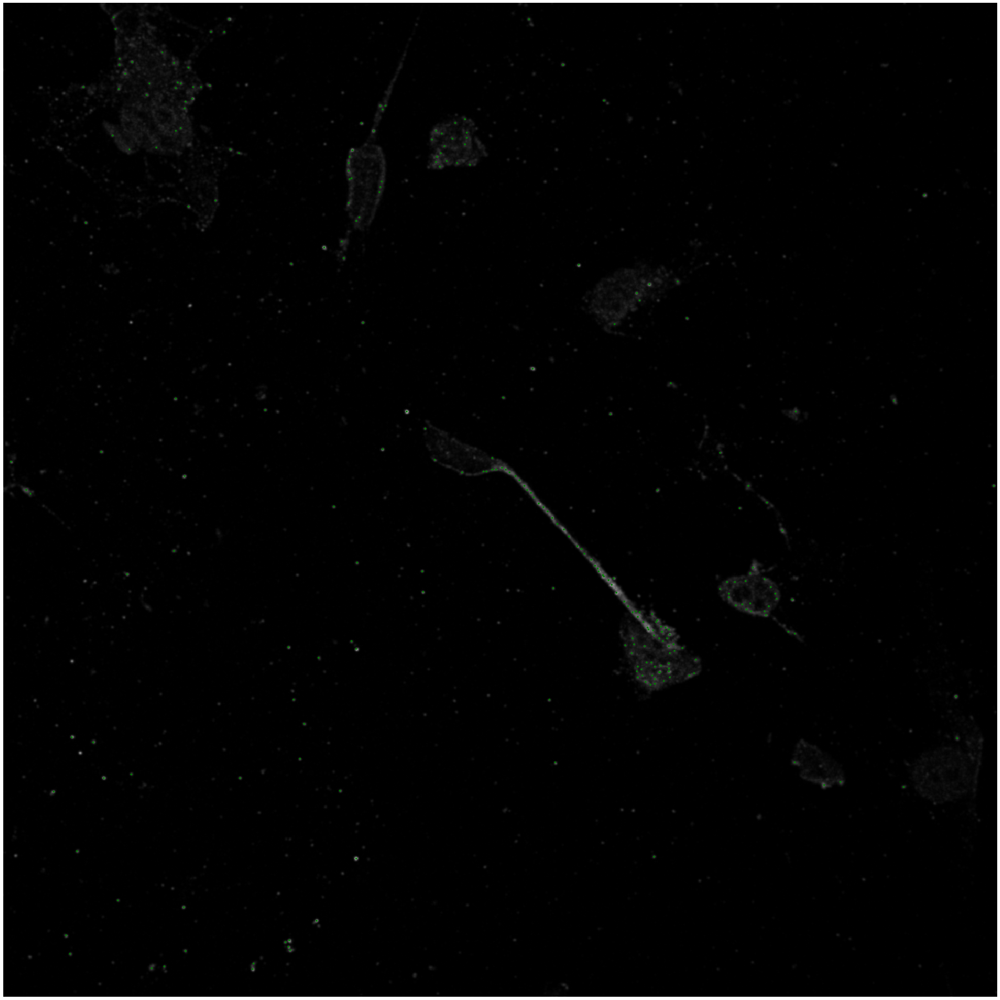

In [6]:
# Determine the correct threshold for detection
# Spots with threshold > upper_threshold = green dots
# Spots with threshold between upper_threshold and lower_threshold = magenta circles

upper_threshold = 0.06
lower_threshold = 0.05
show_low_intensities = True

dots.intensityTool(
    upper_threshold,
    lower_threshold,
    show_low_intensities
)

100%|██████████| 1/1 [00:00<00:00, 104.45it/s]


The number of nuclei is:  11


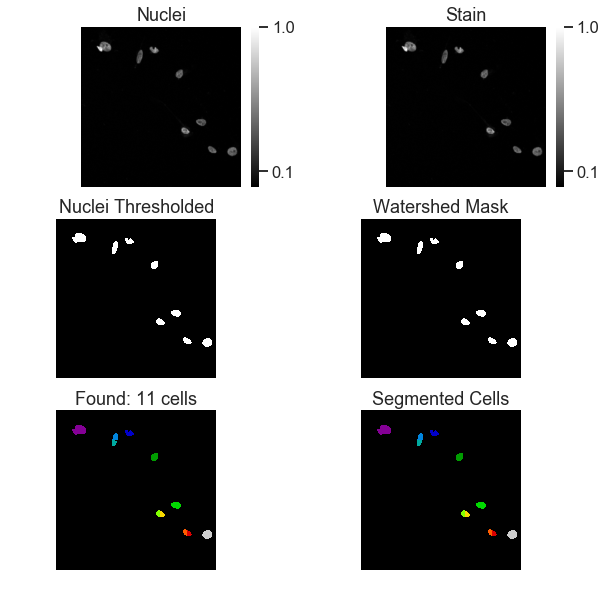

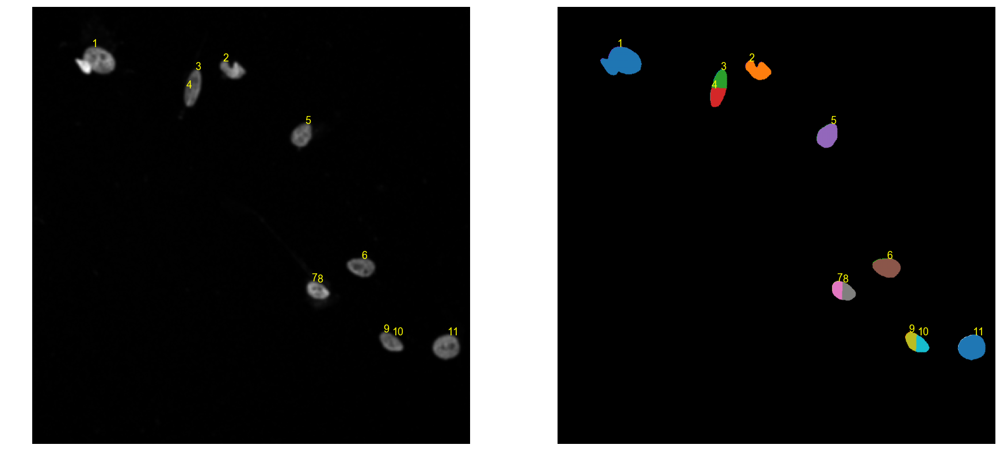

In [7]:
# detect nuclei
from starfish.image import Segmentation

dapi_thresh_nuclei = .18 # lower thresh = more signal # binary mask for cell (nuclear) locations
min_dist_nuclei = 28 # lower minimum distance = more segmented cells
min_depth_nuclei = 0.000001 # the minimum depth of each local minima in the image. Normal range: 0.01-0.00001
min_size_nuclei = 13 # lower minimum size of nucleus = smaller nuclei will show up

# label_image_nuclei,num_nuclei,seg_coords_nuclei,ID_tracker_nuclei,firstRun_nuclei,areYouSure_nuclei = 
firstRun_nuclei,areYouSure_nuclei = nuclei.detectNuclei(
    dapi_thresh_nuclei,
    dapi_thresh_nuclei+0.04, # binary mask for overall cells // binarization of stain,
    min_dist_nuclei,
    min_depth_nuclei,
    min_size_nuclei,
    segFilename=outdir + "nucleiSegmentation_" + series_name + '.png', # if you do NOT want save set the image, then set filename = None
    comparisonFilename=outdir + 'nucleiSegmentationWithIDs_' + series_name + '.png'
)
written=False


{1: 1, 2: 2, 3: 3, 4: 3, 5: 4, 6: 5, 7: 6, 8: 6, 9: 7, 10: 7, 11: 8}
The number of nuclei is:  8


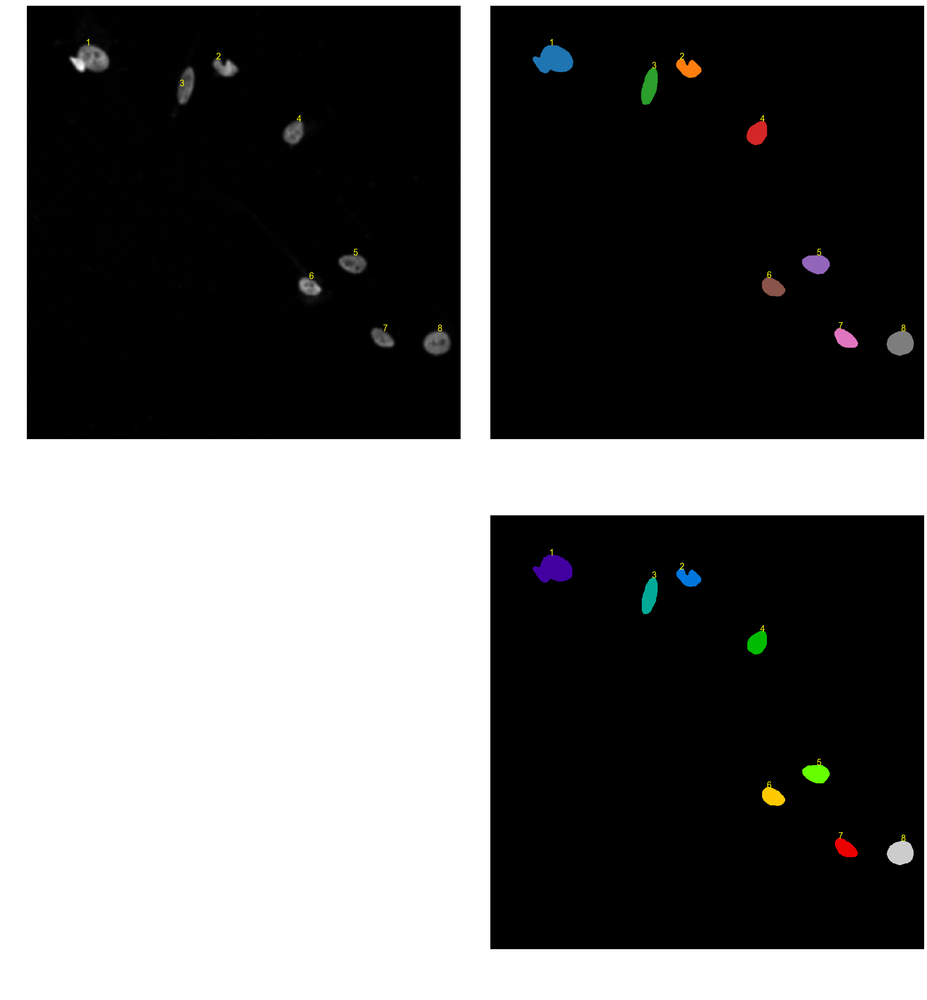

In [8]:
# correct nuclei segmentation

mergeList_nuclei = [(3,4),(7,8),(9,10)]
removeList_nuclei = []

# num_nuclei_corrected,primary_coords_nuclei,label_image_nuclei_corrected,label_dict_nuclei_coords = 
num_nuclei_corrected = nuclei.mergeHelper(
    mergeList_nuclei,
    removeList_nuclei
)

The number of nuclei is:  8


ID,1,2,3,4,5,6,7,8
Num Spots,6,12,5,1,18,19,3,0


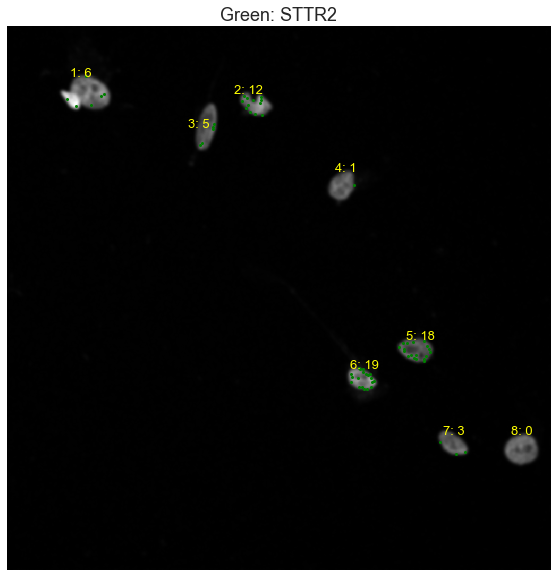

In [9]:
# count spots in segmented nuclei
# you don't need to change any parameters to label the nuclei

# decoded_intensities_with_bacground_nuclei,is_gene1_nuclei,cellSpotsTable_nuclei = 
nuclei.labeling(
    filename=outdir + 'labelImage_trackpy_LMPF.png',
    dotsChannel=dots
)


Is the below list of nuclei correct? If not, edit it, then press OK. You don't have to press OK if the list is already correct.


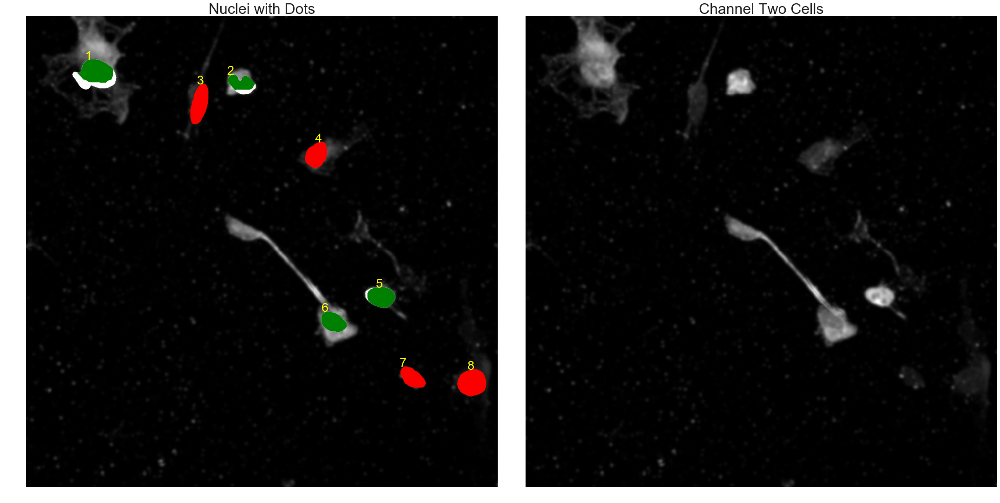

In [10]:
threshold=70

posNuc_ch1, htm = channel1.assignNuclei(threshold, nuclei, "posNuc_ch1")

HTML(htm)

In [11]:
channel1.enterPosNuclei(posNuc_ch1)
channel1.posNuclei

[1, 2, 5, 6]

Is the below list of nuclei correct? If not, edit it, then press OK. You don't have to press OK if the list is already correct.


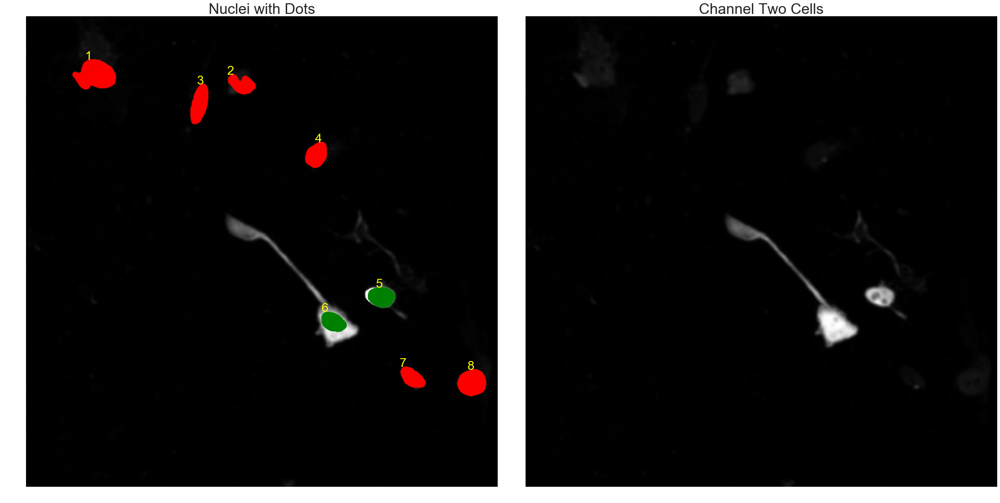

In [12]:
threshold=70

posNuc_ch2, htm2 = channel2.assignNuclei(threshold, nuclei, "posNuc_ch2")

HTML(htm2)

In [13]:
channel2.enterPosNuclei(posNuc_ch2)
channel2.posNuclei

[5, 6]

Is the below list of nuclei correct? If not, edit it, then press OK. You don't have to press OK if the list is already correct.


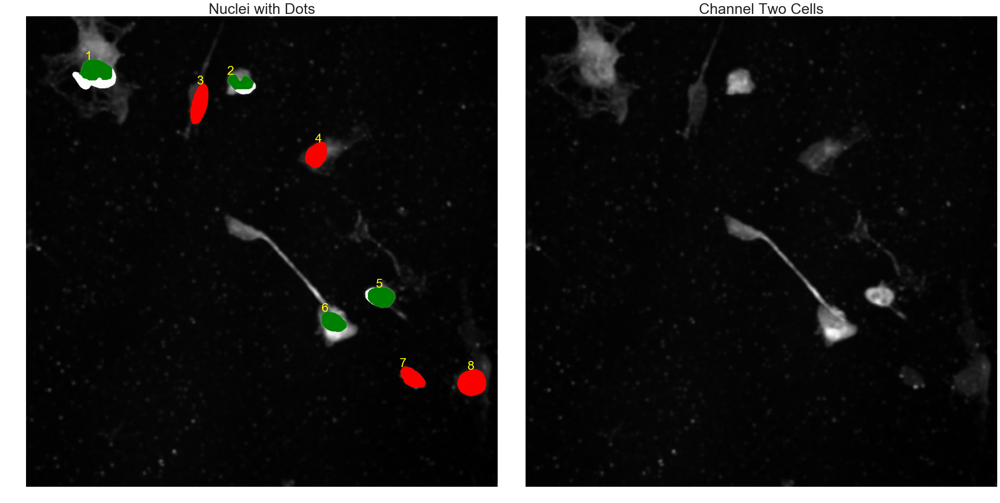

In [14]:
threshold=70

posNuc_ch4, htm = channel4.assignNuclei(threshold, nuclei, "posNuc_ch4")

HTML(htm)

In [15]:
channel4.enterPosNuclei(posNuc_ch4)
channel4.posNuclei

[1, 2, 5, 6]

In [16]:
nuclei.makeNucleiList()

The number of nuclei is:  8


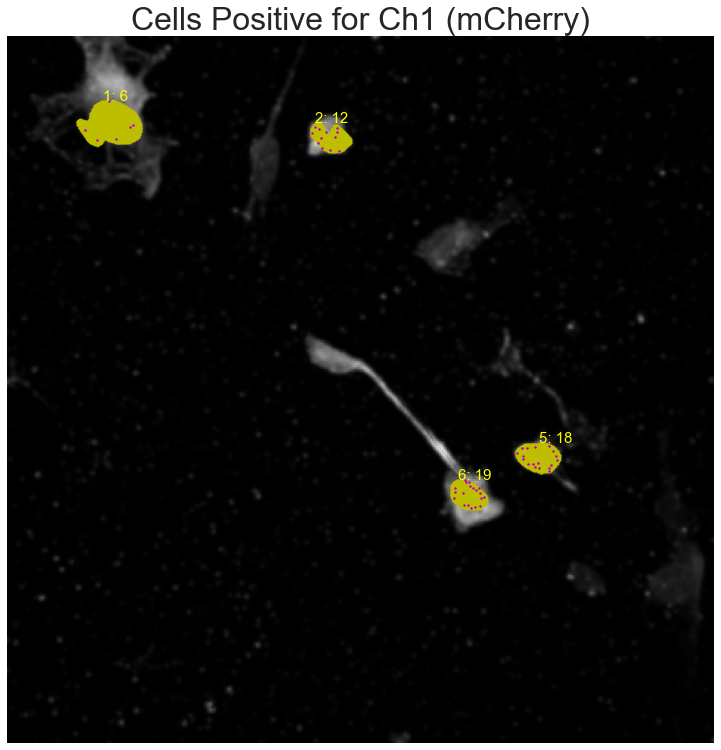

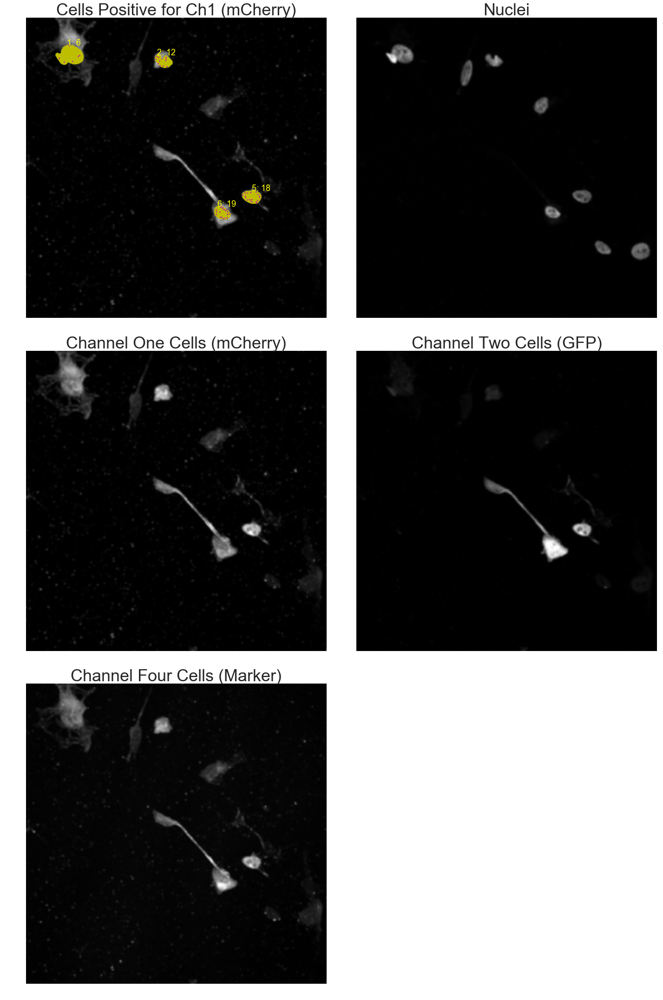

In [17]:
positiveChannels=[nuclei, channel1]
negativeChannels=[]
allCellChannels = [channel1, channel2, channel4]
main_channel = channel1
main_image_title = 'Cells Positive for Ch1 (mCherry)'
channel1.channelName = 'Channel One Cells (mCherry)'
channel2.channelName = 'Channel Two Cells (GFP)'
channel4.channelName = 'Channel Four Cells (Marker)'
filename = outdir + 'cells_Pos1_' + series_name + '.png'

main_channel.compareResults(positiveChannels=positiveChannels, negativeChannels=negativeChannels, allCellChannels=allCellChannels, image_title=main_image_title, filename=filename, nucChannel=nuclei)

nuclei.printNumNuclei()


The number of nuclei is:  8


ID,1,2,3,4,5,6,7,8
Num Spots,6,12,5,1,18,19,3,0


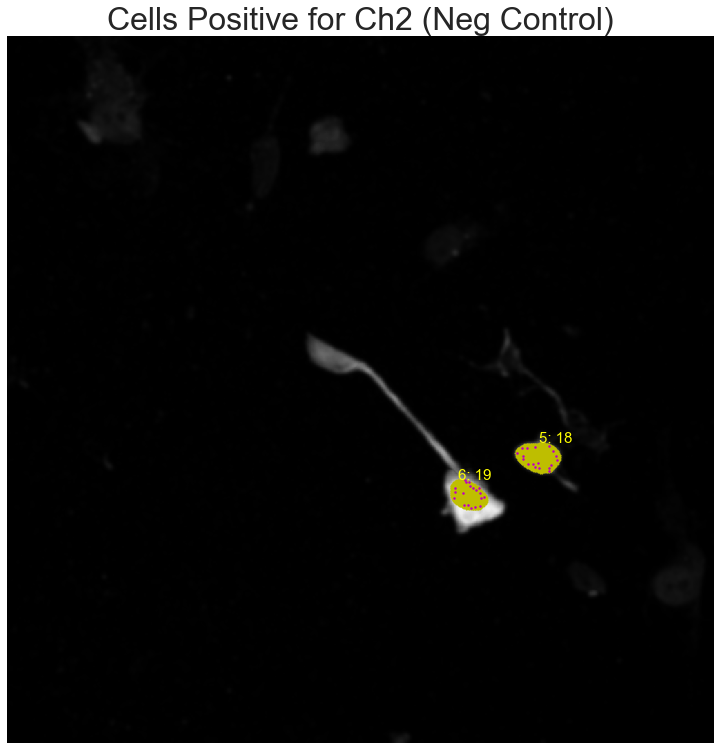

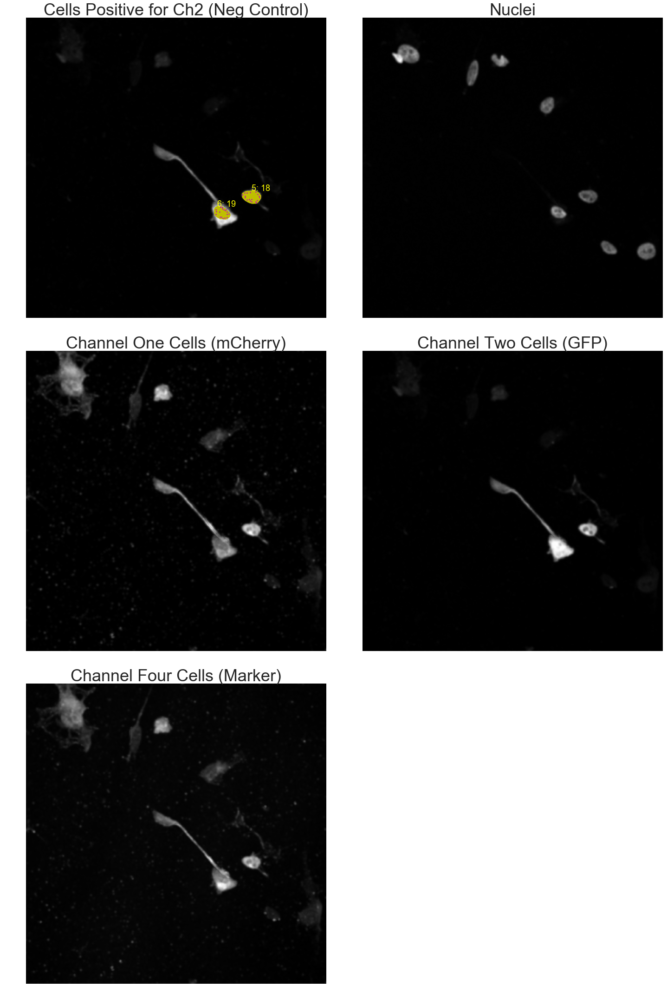

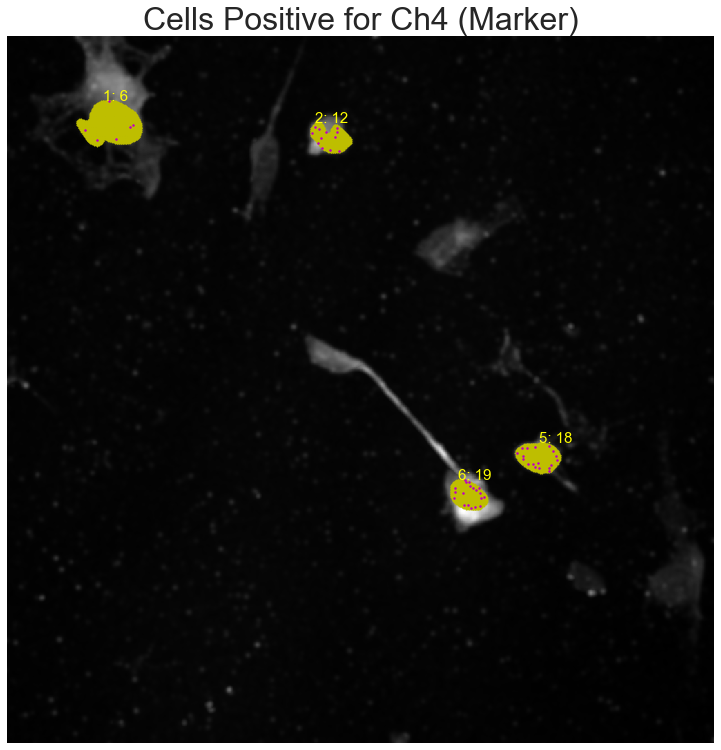

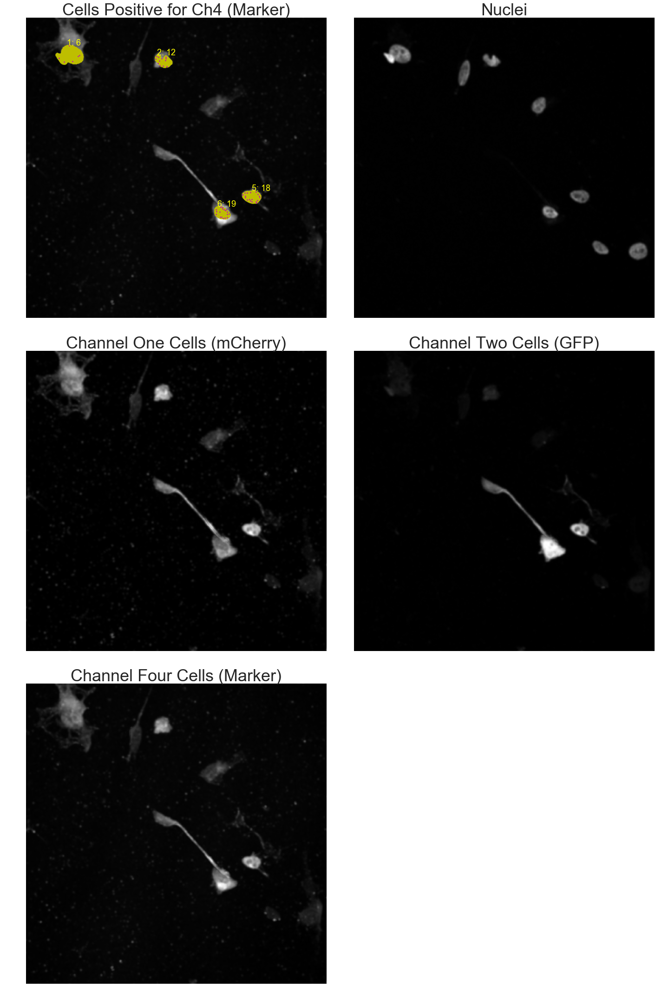

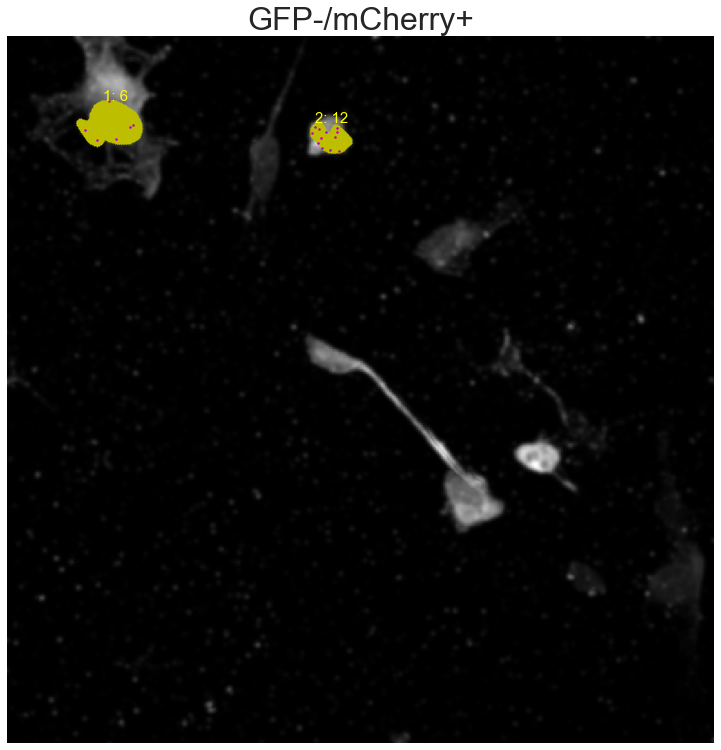

...

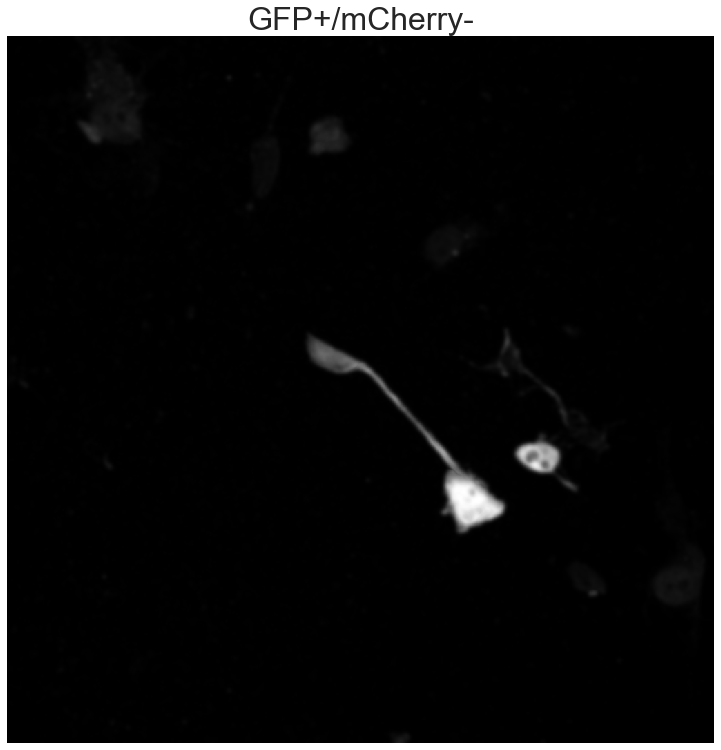

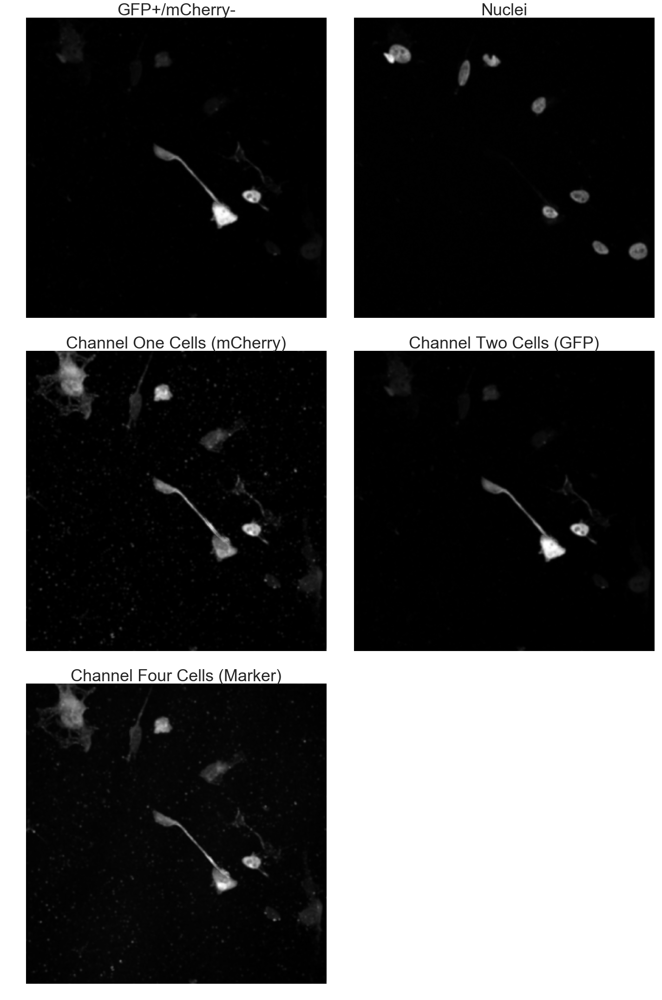

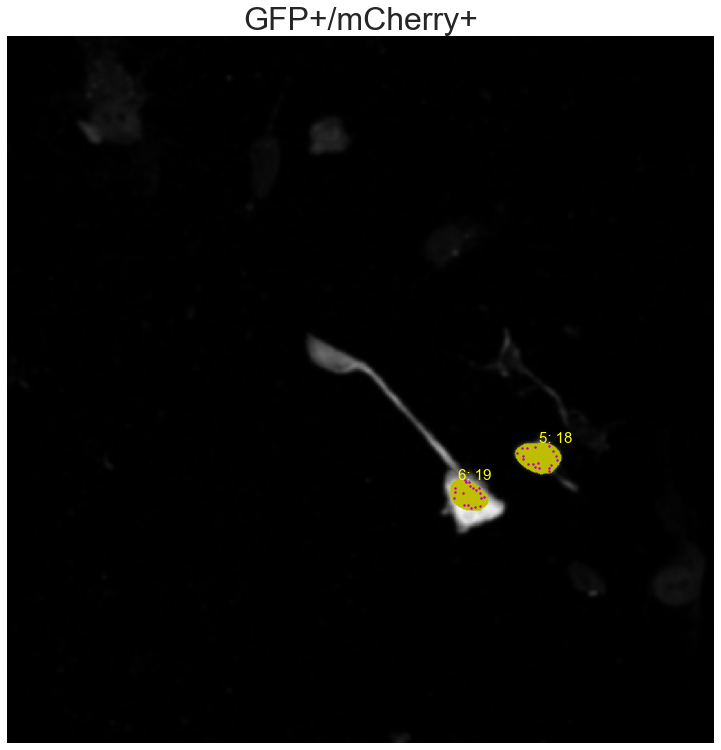

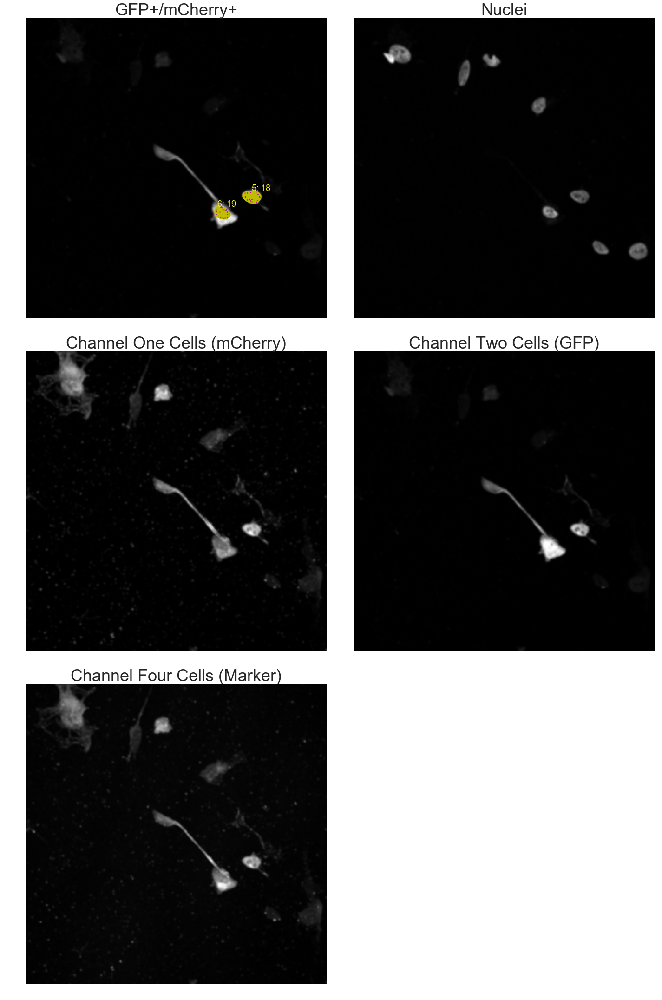

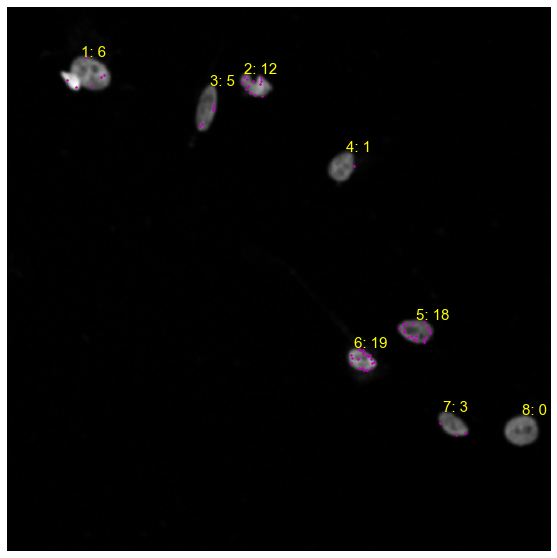

In [18]:
positiveChannels=[nuclei, channel2]
negativeChannels=[]
main_channel = channel2
main_image_title = 'Cells Positive for Ch2 (Neg Control)'
filename = outdir + 'cells_Pos2_' + series_name + '.png'

main_channel.compareResults(positiveChannels=positiveChannels, negativeChannels=negativeChannels, allCellChannels=allCellChannels, image_title=main_image_title, filename=filename, nucChannel=nuclei)

positiveChannels=[nuclei, channel4]
negativeChannels=[]
main_channel = channel4
main_image_title = 'Cells Positive for Ch4 (Marker)'
filename = outdir + 'cells_Pos4_' + series_name + '.png'

main_channel.compareResults(positiveChannels=positiveChannels, negativeChannels=negativeChannels, allCellChannels=allCellChannels, image_title=main_image_title, filename=filename, nucChannel=nuclei)

positiveChannels=[channel1]
negativeChannels=[channel2]
main_channel = channel1
main_image_title = 'GFP-/mCherry+'
filename = outdir + 'cells_PosOneNegTwo_' + series_name + '.png'

main_channel.compareResults(positiveChannels=positiveChannels, negativeChannels=negativeChannels, allCellChannels=allCellChannels, image_title=main_image_title, filename=filename, nucChannel=nuclei)

positiveChannels=[channel2]
negativeChannels=[channel1]
main_channel = channel2
main_image_title = 'GFP+/mCherry-'
filename = outdir + 'cells_PosTwoNegOne_' + series_name + '.png'

main_channel.compareResults(positiveChannels=positiveChannels, negativeChannels=negativeChannels, allCellChannels=allCellChannels, image_title=main_image_title, filename=filename, nucChannel=nuclei)

positiveChannels=[channel1,channel2]
negativeChannels=[]
main_channel = channel2
main_image_title = 'GFP+/mCherry+'
filename = outdir + 'cells_PosOnePosTwo_' + series_name + '.png'

main_channel.compareResults(positiveChannels=positiveChannels, negativeChannels=negativeChannels, allCellChannels=allCellChannels, image_title=main_image_title, filename=filename, nucChannel=nuclei)

nuclei.imageResults()


In [19]:
fijiPath = '/Applications/Fiji.app'
import imagej
import json
ij = initalizeImageJ(fijiPath)

Added 382 JARs to the Java classpath.


The number of nuclei is:  8


ID,1,2,3,4,5,6,7,8
Num Spots,6,12,5,1,18,19,3,0


composite.png saved successfully


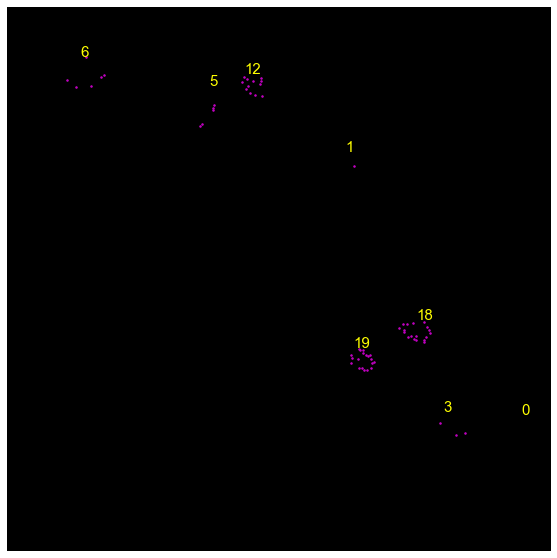

In [20]:
# create composite image

dotsName = 'dotsResults_' + series_name + '.tiff'
fijiPath = '/Applications/Fiji.app'

# there are seven colors available: red, green, blue, gray, cyan, magenta, and yellow
compositeImage(dotsName, ij, dots, nucCh=nuclei, red=channel1, green=channel2, blue=nuclei, gray=channel4, yellow=dots)


In [21]:
# save data in .csv and .xlsx files
cellChannels = [channel1, channel2, channel4]
cellChannelNames = ["Channel 1", "Channel 2", "Channel 4"]

# Define file/directory names
outdir_cumulative = "/Users/sethie/Documents/data_example/"
excel_file_cumulative = outdir_cumulative + "spotsTest.xlsx"
csv_file_cumulative = outdir_cumulative + "spotsTest.csv" # contains data of all results from the whole batch

# Load the rest of the data. You may likely have to modify the below to reflect your experimental design and the data you wish to save.
spacer = len(nuclei.cellSpotsTable[0])-1 # spacer is also the nuclei number
cumulative_data = {series_name:['']*spacer,\
            'Num Nuclei':[spacer]+['']*(spacer-1),\
            'Total Num Spots in Image':[dots.counts[0]]+['']*(spacer-1),\
            'Nucleus ID':nuclei.cellSpotsTable[0][1:],\
            'Num Spots in Nucleus':nuclei.cellSpotsTable[1][1:],\
            'Nucleus IDs positive for Channel 0':nuclei.posNuc_return,\
            'Nucleus IDs positive for Channel 1':channel1.posNuc_return,\
            'Nucleus IDs positive for Channel 2':channel2.posNuc_return,\
            'Nucleus IDs positive for Channel 4':channel4.posNuc_return,\
            'Nucleus IDs for Ch1+/Ch2-':posNucReturn( positive=[channel1], negative=[channel2] ),\
            'Nucleus IDs for Ch1-/Ch2+':posNucReturn( positive=[channel2], negative=[channel1] ),\
            'Nucleus IDs for Ch1+/Ch2+':posNucReturn( positive=[channel1,channel2], negative=[] ),\
            '':['']*spacer}

saveCumulativeData()
written = True

# Establish individual Excel file name and data
excel_file_indiv = outdir + "spots_" + series_name + ".xlsx" # contains data only for the results of the set currently being analyzed
workbook = xlsxwriter.Workbook(excel_file_indiv)
worksheet = workbook.add_worksheet()
excelArray = [list(x) for x  in zip(*nuclei.cellSpotsTable)]
row = 0
for col, data in enumerate(excelArray):
    worksheet.write_column(row, col, data)
    
row = 3
dotsExcelArray = [["Dots Parameters:","HGP sigma (Filtering)",\
                   "# of times HGP filter ran",\
                   "HLP sigma (Filtering)",\
                   "Spots diameter (Detection)",\
                   "Minimum brightness (min_mass)",\
                   "Maximum size of spots",\
                   "Minimum distance between spots"],\
                  ["",dots_high_sigma,num_high_passes,\
                    dots_low_sigma,\
                    spot_diameter,\
                    min_mass,\
                    max_size,\
                    separation]]
for col, data in enumerate(dotsExcelArray):
    worksheet.write_column(row, col, data)
    
row = len(dotsExcelArray[0])+1+row
nucleiExcelArray = [["Channel 0/Nuclei Parameters:",\
                     "HLP sigma (Filtering)",\
                     "DAPI threshold (Segmentation)",\
                     "Min distance between cells",\
                     "Min cell size",\
                     "Minimum depth of local minima",\
                     "Merge List",\
                     "Remove List",\
                     "Positive Cells"],\
                    ['',low_sigma_nuclei,\
                     dapi_thresh_nuclei,\
                     min_dist_nuclei,\
                     min_size_nuclei,\
                     min_depth_nuclei,\
                     str(mergeList_nuclei),\
                     str(removeList_nuclei),\
                     str(nuclei.posNuc_return)]]
for col, data in enumerate(nucleiExcelArray):
    worksheet.write_column(row, col, data)

row = len(nucleiExcelArray[0])+1+row
for i in range(0, len(cellChannels)):
    ch = cellChannels[i]
    channelExcelArray = [[str(cellChannelNames[i]) + " Cell Parameters:",\
                         "HLP sigma (Filtering)",\
                         "Positive Cells"],\
                        ['',ch.low_sigma,\
                         str(sorted(ch.posNuclei))]]
    for col, data in enumerate(channelExcelArray):
        worksheet.write_column(row, col, data)
    row = len(channelExcelArray[0])+1+row 

workbook.close()
print(series_name, "is done!")

data_example is done!
